In [1]:
from emlib import emlib

DEBUG -211- Loaded backend module://ipykernel.pylab.backend_inline version unknown.


In [2]:
def NPZNB_int(t,initial,dtinput,constants):

    B = initial[0]             # benthos
    P = initial[1]             # phytoplankton
    Z = initial[2]             # zooplankton
    DIN = initial[3]           # dissolved inorganic
    DON = initial[4]           # dissolved organic
    ddin = dtinput.Val("ddin") #Concentration by day from WRTDS model 2 columns date and ddin Units are mg/L N
    ddon = dtinput.Val("ddon") #Concentration by day from WRTDS model 2 columns date and ddon mg/l N
    
    i = constants.Val("i")      #irradiance
    Pg = constants.Val("Pg")    # max P growth
    Bg = constants.Val("Bg")    # max B growth
    e = constants.Val("e")      # Z ingestion
    Zm = constants.Val("Zm")    # Z mortality
    Pm = constants.Val("Pm")    # P mortality
    Bm = constants.Val("Bm")    # B mortality
    Pe = constants.Val("Pe")    # P excretion
    Be = constants.Val("Be")    # B excretion
    Pr = constants.Val("Pr")    # P recycle
    h = constants.Val("h")      # Z grazing
    s = constants.Val("s")      # sedimentation
    
    B_dot = (Bg * B)/ (1 + Bg * B) * (DON + DIN) - (Bm * B * B) - (Be * B)
    P_dot = (i * Pg * P * DIN) + (Pr * DON * P) - (h * P * Z) - (Pm * P * P) - (Pe * P)
    Z_dot = ((2 * e - 1)*h * P * Z) - (Zm * Z * Z)-(0.8* (1 - e) * h * P * Z)-(0.2 * (1 - e) * h * P * Z)
   
    
    DIN_dot = ddin + (0.8* (1 - e) * h * P * Z) + (Be * B)+  (Pe * P) \
                - (i * Pg * P * DIN) - ((Bg * B)/ (1 + Bg * B) * (DIN))
    DON_dot = ddon + (Bm * B * B)  +(Pm * P * P)  + (Zm * Z * Z)  + (0.2 * (1 - e) * h * P * Z) \
             - (Pr * DON * P)  - ((Bg * B)/ (1 + Bg * B) * (DON))  - (s * DON)
    return [B_dot,P_dot, Z_dot, DIN_dot, DON_dot]

In [3]:
NPZNB = emlib.Model(NPZNB_int) #save the model

INFO -1104- New Model(1): NPZNB_int
INFO -1116- No algorithm supplied assuming vode/bfd O12 Nsteps3000 dt1
DEBUG -1130- Integrator:vode/bdf order:12 nsteps:3000 dt:1


In [5]:
nutrients= emlib.TimeSeries(dirname="Data",filename="Nueces_input.csv") #loading in input timeseries data ddin and ddon in same file

INFO -879- New TimeSeries instance: 2
DEBUG -951- New INPUT table DataNueces_input.csv['ï»¿Date', 'ddin', 'ddon']
DEBUG -962- Saved 4442 rows and 2 columns
DEBUG -964- Converted dates to contiguous np.array
DEBUG -966- Converted input data to contiguous np.array


In [6]:
BTest = emlib.Observation ("B", dirname="Data",filename= "NB_Count_Calibrate.csv")

DEBUG -739- ['DATE', 'B']
DEBUG -741- New OBS for value:B COLMS:1 DataNB_Count_Calibrate.csv
INFO -758- Read file DataNB_Count_Calibrate.csv 51 Observations for value B


In [7]:
NPZNBcalibration = emlib.Calibration()
NPZNBcalibration.Add("i",val=0.5, min= 0.001, max= 3.0)#from Turner 2014
NPZNBcalibration.Add("Pg",val=0.15,min= 0.001, max= 3.0)#from Turner 2014
NPZNBcalibration.Add("Bg",val=0.15,min= 0.001, max= 3.0)#from Turner 2014
NPZNBcalibration.Add("e",val=0.1,min= 0.001, max= 1.0)#from Turner 2014
NPZNBcalibration.Add("Zm",val=0.3,min= 0.001, max= 3.0)#from Turner 2014
NPZNBcalibration.Add("Pm",val=0.5,min= 0.001, max= 3.0)#from Turner 2014
NPZNBcalibration.Add("Bm",val=0.5,min= 0.001, max= 3.0)#from Turner 2014
NPZNBcalibration.Add("Pe",val=0.05,min= 0.001, max= 3.0)#random number
NPZNBcalibration.Add("Be",val=0.05,min= 0.001, max= 3.0)#random number
NPZNBcalibration.Add("Pr",val=0.15,min= 0.001, max= 3.0)#random number
NPZNBcalibration.Add("h",val=0.15,min=0.01,max=2.0)#random moving number
NPZNBcalibration.Add("s",val=0.25,min= .001, max= 2.0)#from Turner 2014
NPZNBcalibration.initial=[1.0,1.0,1.0,1.0,1.0]

INFO -352- New Calibration instance: 1
DEBUG -595- C:1 i 0.5 False
DEBUG -595- C:2 Pg 0.15 False
DEBUG -595- C:3 Bg 0.15 False
DEBUG -595- C:4 e 0.1 False
DEBUG -595- C:5 Zm 0.3 False
DEBUG -595- C:6 Pm 0.5 False
DEBUG -595- C:7 Bm 0.5 False
DEBUG -595- C:8 Pe 0.05 False
DEBUG -595- C:9 Be 0.05 False
DEBUG -595- C:10 Pr 0.15 False
DEBUG -595- C:11 h 0.15 False
DEBUG -595- C:12 s 0.25 False


DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -2515- update_title_pos
DEBUG -1254- findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0 to DejaVu Sans ('C:\\Users\\mrohal\\AppData\\Local\\Cont

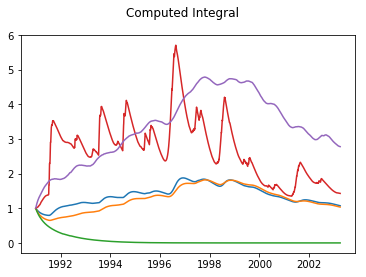

In [8]:
NPZNB.Integrate(NPZNBcalibration.initial, Calibration=NPZNBcalibration,TimeSeries= nutrients, dt=0.01) 
legend = ["B", "P", "Z", "DIN","DON"]
NPZNB.Draw()

In [10]:
best = NPZNB.Calibrate (NPZNBcalibration, BTest, runs =10000, TimeSeries= nutrients)

WARNING -1352- No fitness method provided, assuming GF_BruteForceMSE
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:30.1 RMSE:4.281 RANGE%37.3 WMSE:11.2
DEBUG -1452- New fi

New Best Calibration
Label	Value	Min	Max	ISConst	Desc
i 	 0.6991681808901831 	 0.001 	 3.0 	 False 	 None
Pg 	 0.2481721884231668 	 0.001 	 3.0 	 False 	 None
Bg 	 0.7041782330700116 	 0.001 	 3.0 	 False 	 None
e 	 0.5993655449428433 	 0.001 	 1.0 	 False 	 None
Zm 	 0.19689698803242436 	 0.001 	 3.0 	 False 	 None
Pm 	 2.3588664258778542 	 0.001 	 3.0 	 False 	 None
Bm 	 1.7704909359581822 	 0.001 	 3.0 	 False 	 None
Pe 	 1.1002344053493611 	 0.001 	 3.0 	 False 	 None
Be 	 1.3725866991020326 	 0.001 	 3.0 	 False 	 None
Pr 	 1.9985266447151877 	 0.001 	 3.0 	 False 	 None
h 	 0.7006891622417188 	 0.01 	 2.0 	 False 	 None
s 	 0.05286049149448426 	 0.001 	 2.0 	 False 	 None


DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.2 RMSE:5.065 RANGE%2.0 WMSE:15.1
DEBUG -1452- New fitness object:10008
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:

DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.2 RMSE:5.064 RANGE%2.0 WMSE:15.1
DEBUG -1452- New fitness object:10017
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG

New Best Calibration
Label	Value	Min	Max	ISConst	Desc
i 	 0.4510328048383871 	 0.001 	 3.0 	 False 	 None
Pg 	 0.8869969091061205 	 0.001 	 3.0 	 False 	 None
Bg 	 2.6329369586029667 	 0.001 	 3.0 	 False 	 None
e 	 0.19779041279455495 	 0.001 	 1.0 	 False 	 None
Zm 	 0.8565048844713414 	 0.001 	 3.0 	 False 	 None
Pm 	 1.9997264571236326 	 0.001 	 3.0 	 False 	 None
Bm 	 0.4037116114499732 	 0.001 	 3.0 	 False 	 None
Pe 	 0.169840700736522 	 0.001 	 3.0 	 False 	 None
Be 	 0.687098378296028 	 0.001 	 3.0 	 False 	 None
Pr 	 0.5375809344337124 	 0.001 	 3.0 	 False 	 None
h 	 1.0414285210980705 	 0.01 	 2.0 	 False 	 None
s 	 0.02547373550167714 	 0.001 	 2.0 	 False 	 None



DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.7 RMSE:4.548 RANGE%27.5 WMSE:12.8
DEBUG -1452- New fitness object:10025
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remainin

New Best Calibration
Label	Value	Min	Max	ISConst	Desc
i 	 2.9824678235578728 	 0.001 	 3.0 	 False 	 None
Pg 	 0.05967248450142782 	 0.001 	 3.0 	 False 	 None
Bg 	 0.5732847134939957 	 0.001 	 3.0 	 False 	 None
e 	 0.8311445267954959 	 0.001 	 1.0 	 False 	 None
Zm 	 0.3759232516520814 	 0.001 	 3.0 	 False 	 None
Pm 	 1.9660684705147558 	 0.001 	 3.0 	 False 	 None
Bm 	 0.1576090952265856 	 0.001 	 3.0 	 False 	 None
Pe 	 1.5582058944137178 	 0.001 	 3.0 	 False 	 None
Be 	 0.34264221257046273 	 0.001 	 3.0 	 False 	 None
Pr 	 0.9526640586119691 	 0.001 	 3.0 	 False 	 None
h 	 1.5385975153590428 	 0.01 	 2.0 	 False 	 None
s 	 0.38872140967483326 	 0.001 	 2.0 	 False 	 None


DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.7 RMSE:4.789 RANGE%19.6 WMSE:13.7
DEBUG -1452- New fitness object:10030
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining

DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.321 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:10039
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1

DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.3 RMSE:5.307 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:10047
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:44

DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.7 RMSE:4.365 RANGE%31.4 WMSE:11.8
DEBUG -1452- New fitness object:10056
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining

DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.8 RMSE:5.213 RANGE%0 WMSE:15.9
DEBUG -1452- New fitness object:10065
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.9 RMSE:4.966 RANGE%7.8 WMSE:14.6
DEBUG -1452- New fitness object:10073
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.1 RMSE:4.891 RANGE%13.7 WMSE:14.2
DEBUG -1452- New fitness object:10082
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:10090
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.3 RMSE:4.448 RANGE%35.3 WMSE:12.1
DEBUG -1452- New fitness object:10091
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:32.1 RMSE:4.154 RANGE%43.1 WMSE:10.8
DEBUG -1452- New fitness object:10099
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.338 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:10108
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:10116
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.331 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:10117
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.8 RMSE:4.724 RANGE%21.6 WMSE:13.4
DEBUG -1452- New fitness object:10125
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.4 RMSE:4.443 RANGE%35.3 WMSE:12.0
DEBUG -1452- New fitness object:10134
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:10142
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.0 RMSE:5.082 RANGE%0 WMSE:15.2
DEBUG -1452- New fitness object:10143
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.32 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:10151
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:31.0 RMSE:4.225 RANGE%33.3 WMSE:11.3
DEBUG -1452- New fitness object:10160
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:10168
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.9 RMSE:5.266 RANGE%0 WMSE:16.2
DEBUG -1452- New fitness object:10169
DEBUG -1137- OD

New Best Calibration
Label	Value	Min	Max	ISConst	Desc
i 	 0.8227709598062873 	 0.001 	 3.0 	 False 	 None
Pg 	 1.0913968595316723 	 0.001 	 3.0 	 False 	 None
Bg 	 1.6638857240135614 	 0.001 	 3.0 	 False 	 None
e 	 0.011643422254122779 	 0.001 	 1.0 	 False 	 None
Zm 	 1.6493789689139549 	 0.001 	 3.0 	 False 	 None
Pm 	 0.8656096578163804 	 0.001 	 3.0 	 False 	 None
Bm 	 0.08126359983379618 	 0.001 	 3.0 	 False 	 None
Pe 	 1.0644081431505283 	 0.001 	 3.0 	 False 	 None
Be 	 0.2036204256092451 	 0.001 	 3.0 	 False 	 None
Pr 	 0.6845711193930116 	 0.001 	 3.0 	 False 	 None
h 	 0.5175353915709746 	 0.01 	 2.0 	 False 	 None
s 	 0.41284781758520295 	 0.001 	 2.0 	 False 	 None


DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.3 RMSE:4.636 RANGE%25.5 WMSE:13.0
DEBUG -1452- New fitness object:10174
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining

DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.9 RMSE:4.594 RANGE%25.5 WMSE:12.7
DEBUG -1452- New fitness object:10183
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.9 RMSE:4.716 RANGE%21.6 WMSE:13.4
DEBUG -1452- New fitness object:10191
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.336 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:10200
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:10208
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:33.1 RMSE:4.095 RANGE%39.2 WMSE:10.8
DEBUG -1452- New fitness object:10209
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.3 RMSE:5.063 RANGE%2.0 WMSE:15.1
DEBUG -1452- New fitness object:10217
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:34.2 RMSE:4.029 RANGE%41.2 WMSE:10.1
DEBUG -1452- New fitness object:10226
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:10234
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:35.3 RMSE:3.961 RANGE%45.1 WMSE:9.8
DEBUG -1452- New fitness object:10235
DEBUG -1137- 

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.8 RMSE:4.787 RANGE%19.6 WMSE:13.7
DEBUG -1452- New fitness object:10243
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.311 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:10252
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:10260
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:40.7 RMSE:3.629 RANGE%37.3 WMSE:16.3
DEBUG -1452- New fitness object:10261
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.3 RMSE:5.061 RANGE%2.0 WMSE:15.1
DEBUG -1452- New fitness object:10269
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.9 RMSE:4.474 RANGE%29.4 WMSE:12.1
DEBUG -1452- New fitness object:10278
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:10286
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.6 RMSE:5.106 RANGE%0 WMSE:15.3
DEBUG -1452- New fitness object:10287
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.9 RMSE:4.844 RANGE%17.6 WMSE:13.9
DEBUG -1452- New fitness object:10295
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:37.1 RMSE:3.847 RANGE%47.1 WMSE:9.8
DEBUG -1452- New fitness object:10304
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:10312
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:31.8 RMSE:4.173 RANGE%39.2 WMSE:10.7
DEBUG -1452- New fitness object:10313
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.321 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:10321
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:14

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.8 RMSE:5.034 RANGE%5.9 WMSE:15.0
DEBUG -1452- New fitness object:10330
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -1452- New fitness object:10338
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.328 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:10339
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.1 RMSE:4.951 RANGE%9.8 WMSE:14.5
DEBUG -1452- New fitness object:10347
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.7 RMSE:4.485 RANGE%27.5 WMSE:12.6
DEBUG -1452- New fitness object:10356
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:10364
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.5 RMSE:5.046 RANGE%5.9 WMSE:15.3
DEBUG -1452- New fitness object:10365
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.7 RMSE:5.219 RANGE%0 WMSE:15.9
DEBUG -1452- New fitness object:10373
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:32.6 RMSE:4.128 RANGE%29.4 WMSE:19.0
DEBUG -1452- New fitness object:10382
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:10390
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.6 RMSE:4.617 RANGE%25.5 WMSE:12.9
DEBUG -1452- New fitness object:10391
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.7 RMSE:5.279 RANGE%0 WMSE:16.2
DEBUG -1452- New fitness object:10399
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:14

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.335 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:10408
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.2 RMSE:5.066 RANGE%2.0 WMSE:15.2
DEBUG -1452- New fitness object:10416
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.6 RMSE:4

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.328 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:10425
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:10434
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.33 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:10442
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:33.8 RMSE:4.05

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.0 RMSE:5.019 RANGE%5.9 WMSE:14.8
DEBUG -1452- New fitness object:10451
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.7 RMSE:5.035 RANGE%5.9 WMSE:14.9
DEBUG -1452- New fitness object:10460
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.2 RMSE:4.458 RANGE%31.4 WMSE:12.2
DEBUG -1452- New fitness object:10468
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.3 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.4 RMSE:5.238 RANGE%0 WMSE:16.0
DEBUG -1452- New fitness object:10477
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.4 RMSE:5.3 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:10486
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DE

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.3 RMSE:5.308 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:10494
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.3

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.6 RMSE:4.429 RANGE%35.3 WMSE:11.8
DEBUG -1452- New fitness object:10503
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:30.9 RMSE:4.226 RANGE%37.3 WMSE:11.2
DEBUG -1452- New fitness object:10512
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.0 RMSE:5.262 RANGE%0 WMSE:16.2
DEBUG -1452- New fitness object:10520
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.6 RMSE:4.6

DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.336 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:10529
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:24

DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.324 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:10538
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 

DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.8 RMSE:4.848 RANGE%13.7 WMSE:14.3
DEBUG -1452- New fitness object:10546
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268-

DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.7 RMSE:5.04 RANGE%5.9 WMSE:15.0
DEBUG -1452- New fitness object:10555
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2

DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.0 RMSE:5.082 RANGE%2.0 WMSE:15.2
DEBUG -1452- New fitness object:10564
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm'

DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:43.8 RMSE:3.438 RANGE%52.9 WMSE:8.9
DEBUG -1452- New fitness object:10572
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- 

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:35.9 RMSE:3.923 RANGE%45.1 WMSE:10.0
DEBUG -1452- New fitness object:10581
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.2 RMSE:4.579 RANGE%25.5 WMSE:12.7
DEBUG -1452- New fitness object:10590
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.6 RMSE:5.228 RANGE%0 WMSE:15.9
DEBUG -1452- New fitness object:10598
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.5 RMSE:5.2

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.334 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:10607
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.8 RMSE:4.416 RANGE%35.3 WMSE:11.8
DEBUG -1452- New fitness object:10616
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.314 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:10624
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.3

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.6 RMSE:5.045 RANGE%3.9 WMSE:15.0
DEBUG -1452- New fitness object:10633
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:10642
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:10650
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.9 RMSE:4.901 RANGE%13.7 WMSE:14.3
DEBUG -1452- New fitness object:10651
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.324 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:10659
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.7 RMSE:5.157 RANGE%0 WMSE:15.7
DEBUG -1452- New fitness object:10668
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:10676
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.4 RMSE:4.691 RANGE%23.5 WMSE:13.3
DEBUG -1452- New fitness object:10677
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.5 RMSE:4.559 RANGE%29.4 WMSE:12.6
DEBUG -1452- New fitness object:10685
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:35.0 RMSE:3.978 RANGE%43.1 WMSE:10.3
DEBUG -1452- New fitness object:10694
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:10702
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.6 RMSE:4.617 RANGE%25.5 WMSE:12.8
DEBUG -1452- New fitness object:10703
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.337 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:10711
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.0 RMSE:5.199 RANGE%0 WMSE:15.9
DEBUG -1452- New fitness object:10720
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:10728
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.9 RMSE:4.533 RANGE%31.4 WMSE:12.6
DEBUG -1452- New fitness object:10729
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.324 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:10737
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:43.8 RMSE:3.442 RANGE%52.9 WMSE:9.0
DEBUG -1452- New fitness object:10746
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:10754
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.0 RMSE:5.263 RANGE%0 WMSE:16.2
DEBUG -1452- New fitness object:10755
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.3 RMSE:4.817 RANGE%17.6 WMSE:13.9
DEBUG -1452- New fitness object:10763
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:35.2 RMSE:3.966 RANGE%47.1 WMSE:10.1
DEBUG -1452- New fitness object:10772
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:10780
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.0 RMSE:4.59 RANGE%27.5 WMSE:12.8
DEBUG -1452- New fitness object:10781
DEBUG -1137- 

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.3 RMSE:5.246 RANGE%0 WMSE:16.1
DEBUG -1452- New fitness object:10789
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:14

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.312 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:10798
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.1 RMSE:4.708 RANGE%21.6 WMSE:13.2
DEBUG -1452- New fitness object:10806
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.9 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.6 RMSE:4.98 RANGE%9.8 WMSE:14.7
DEBUG -1452- New fitness object:10815
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:10824
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.7 RMSE:4.667 RANGE%23.5 WMSE:13.0
DEBUG -1452- New fitness object:10832
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.2 RMSE:4.396 RANGE%35.3 WMSE:11.9
DEBUG -1452- New fitness object:10841
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.0 RMSE:4.894 RANGE%9.8 WMSE:14.3
DEBUG -1452- New fitness object:10850
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.321 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:10858
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.0 RMSE:5.0

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:37.0 RMSE:3.857 RANGE%39.2 WMSE:9.5
DEBUG -1452- New fitness object:10867
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:35.6 RMSE:3.942 RANGE%47.1 WMSE:10.1
DEBUG -1452- New fitness object:10876
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.4 RMSE:5.303 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:10884
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:48.0 RMSE:3.1

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:33.2 RMSE:4.086 RANGE%43.1 WMSE:10.8
DEBUG -1452- New fitness object:10893
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.329 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:10902
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:10910
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.9 RMSE:4.964 RANGE%7.8 WMSE:14.6
DEBUG -1452- New fitness object:10911
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.7 RMSE:5.218 RANGE%0 WMSE:16.0
DEBUG -1452- New fitness object:10919
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

New Best Calibration
Label	Value	Min	Max	ISConst	Desc
i 	 1.0535182486344656 	 0.001 	 3.0 	 False 	 None
Pg 	 0.07345657999047865 	 0.001 	 3.0 	 False 	 None
Bg 	 1.9737858150976204 	 0.001 	 3.0 	 False 	 None
e 	 0.36735281528689434 	 0.001 	 1.0 	 False 	 None
Zm 	 2.6667129886199556 	 0.001 	 3.0 	 False 	 None
Pm 	 1.453234433557611 	 0.001 	 3.0 	 False 	 None
Bm 	 0.3497366615985811 	 0.001 	 3.0 	 False 	 None
Pe 	 0.9029495984570701 	 0.001 	 3.0 	 False 	 None
Be 	 0.10019056103447263 	 0.001 	 3.0 	 False 	 None
Pr 	 0.7345982083335124 	 0.001 	 3.0 	 False 	 None
h 	 0.8513128867566472 	 0.01 	 2.0 	 False 	 None
s 	 0.12107313966002325 	 0.001 	 2.0 	 False 	 None


DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.0 RMSE:5.202 RANGE%0 WMSE:15.8
DEBUG -1452- New fitness object:10926
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:34

DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:44.0 RMSE:3.426 RANGE%60.8 WMSE:8.4
DEBUG -1452- New fitness object:10935
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:33.8 RMSE:4.053 RANGE%43.1 WMSE:10.4
DEBUG -1452- New fitness object:10943
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.9 RMSE:4.655 RANGE%23.5 WMSE:13.2
DEBUG -1452- New fitness object:10952
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:10960
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.2 RMSE:4.393 RANGE%39.2 WMSE:11.8
DEBUG -1452- New fitness object:10961
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.8 RMSE:4.972 RANGE%7.8 WMSE:14.6
DEBUG -1452- New fitness object:10969
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.8 RMSE:4.846 RANGE%13.7 WMSE:14.1
DEBUG -1452- New fitness object:10978
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:10986
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:46.2 RMSE:3.291 RANGE%56.9 WMSE:9.3
DEBUG -1452- New fitness object:10987
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:10995
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.6 RMSE:4.673 RANGE%23.5 WMSE:13.1
DEBUG -1452- New fitness object:11004
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:11012
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.4 RMSE:4.69 RANGE%23.5 WMSE:13.3
DEBUG -1452- New fitness object:11013
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.328 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11021
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.336 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:11030
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:11038
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.5 RMSE:5.231 RANGE%0 WMSE:16.0
DEBUG -1452- New fitness object:11039
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.4 RMSE:5.302 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:11047
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.3 RMSE:5.185 RANGE%0 WMSE:15.8
DEBUG -1452- New fitness object:11056
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:11064
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.5 RMSE:4.624 RANGE%25.5 WMSE:12.9
DEBUG -1452- New fitness object:11065
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.331 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11073
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.324 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11082
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:11090
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:44.3 RMSE:3.411 RANGE%35.3 WMSE:15.2
DEBUG -1452- New fitness object:11091
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.1 RMSE:4.827 RANGE%17.6 WMSE:13.9
DEBUG -1452- New fitness object:11099
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:33.1 RMSE:4.093 RANGE%41.2 WMSE:10.8
DEBUG -1452- New fitness object:11108
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.4 RMSE:5.24 RANGE%0 WMSE:16.0
DEBUG -1452- New fitness object:11116
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.0 RMSE:5.26

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:31.0 RMSE:4.22 RANGE%39.2 WMSE:11.0
DEBUG -1452- New fitness object:11125
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.6 RMSE:4.979 RANGE%7.8 WMSE:14.7
DEBUG -1452- New fitness object:11134
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.0 RMSE:5.079 RANGE%2.0 WMSE:15.2
DEBUG -1452- New fitness object:11142
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.1 RMSE:4

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.321 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11151
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.8 RMSE:5.15 RANGE%0 WMSE:15.6
DEBUG -1452- New fitness object:11160
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
D

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.328 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11168
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.5 RMSE:4.4

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.323 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11177
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:29.3 RMSE:4.326 RANGE%29.4 WMSE:11.7
DEBUG -1452- New fitness object:11186
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -1452- New fitness object:11194
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:46.3 RMSE:3.289 RANGE%54.9 WMSE:8.7
DEBUG -1452- New fitness object:11195
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.4 RMSE:4.384 RANGE%35.3 WMSE:11.9
DEBUG -1452- New fitness object:11203
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.3 RMSE:4.631 RANGE%25.5 WMSE:12.9
DEBUG -1452- New fitness object:11212
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:11220
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.331 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11221
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.4 RMSE:4.686 RANGE%25.5 WMSE:13.3
DEBUG -1452- New fitness object:11229
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.31 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11238
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942

DEBUG -1452- New fitness object:11246
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:32.8 RMSE:4.113 RANGE%39.2 WMSE:10.5
DEBUG -1452- New fitness object:11247
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.0 RMSE:5.143 RANGE%0 WMSE:15.5
DEBUG -1452- New fitness object:11255
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.4 RMSE:5.241 RANGE%0 WMSE:16.1
DEBUG -1452- New fitness object:11264
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:11272
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.8 RMSE:4.662 RANGE%23.5 WMSE:13.1
DEBUG -1452- New fitness object:11273
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.8 RMSE:5.276 RANGE%0 WMSE:16.2
DEBUG -1452- New fitness object:11281
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.331 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11290
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:11298
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.3 RMSE:4.452 RANGE%35.3 WMSE:12.0
DEBUG -1452- New fitness object:11299
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.8 RMSE:5.089 RANGE%0 WMSE:15.3
DEBUG -1452- New fitness object:11307
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.8 RMSE:4.97 RANGE%7.8 WMSE:14.6
DEBUG -1452- New fitness object:11316
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:39

DEBUG -1452- New fitness object:11324
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.0 RMSE:4.959 RANGE%9.8 WMSE:14.6
DEBUG -1452- New fitness object:11325
DEBUG -1137- 

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.3 RMSE:4.815 RANGE%19.6 WMSE:13.8
DEBUG -1452- New fitness object:11333
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.317 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11342
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:11350
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.1 RMSE:5.071 RANGE%2.0 WMSE:15.1
DEBUG -1452- New fitness object:11351
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:31.4 RMSE:4.199 RANGE%33.3 WMSE:11.1
DEBUG -1452- New fitness object:11359
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.8 RMSE:4.664 RANGE%23.5 WMSE:13.0
DEBUG -1452- New fitness object:11368
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:11376
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.337 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:11377
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.6 RMSE:4.797 RANGE%19.6 WMSE:13.7
DEBUG -1452- New fitness object:11385
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:40.1 RMSE:3.665 RANGE%51.0 WMSE:8.9
DEBUG -1452- New fitness object:11394
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:11402
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.0 RMSE:5.201 RANGE%0 WMSE:15.8
DEBUG -1452- New fitness object:11403
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.9 RMSE:4.659 RANGE%25.5 WMSE:13.0
DEBUG -1452- New fitness object:11411
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.6 RMSE:4.922 RANGE%13.7 WMSE:14.4
DEBUG -1452- New fitness object:11420
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:11428
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.7 RMSE:5.095 RANGE%2.0 WMSE:15.3
DEBUG -1452- New fitness object:11429
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.312 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11437
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.1 RMSE:5.136 RANGE%2.0 WMSE:15.6
DEBUG -1452- New fitness object:11446
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:11454
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.3 RMSE:4.817 RANGE%19.6 WMSE:13.8
DEBUG -1452- New fitness object:11455
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.1 RMSE:4.765 RANGE%19.6 WMSE:13.6
DEBUG -1452- New fitness object:11463
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.2 RMSE:4.763 RANGE%13.7 WMSE:13.5
DEBUG -1452- New fitness object:11472
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:11480
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.0 RMSE:4.587 RANGE%27.5 WMSE:12.7
DEBUG -1452- New fitness object:11481
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.4 RMSE:5.118 RANGE%0 WMSE:15.4
DEBUG -1452- New fitness object:11489
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:14

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.32 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11498
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
D

DEBUG -1452- New fitness object:11506
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.0 RMSE:4.776 RANGE%19.6 WMSE:13.6
DEBUG -1452- New fitness object:11507
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.4 RMSE:4.933 RANGE%7.8 WMSE:14.5
DEBUG -1452- New fitness object:11515
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.9 RMSE:4.716 RANGE%21.6 WMSE:13.4
DEBUG -1452- New fitness object:11524
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.0 RMSE:4.836 RANGE%15.7 WMSE:13.9
DEBUG -1452- New fitness object:11532
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.9 RMSE:5.089 RANGE%0 WMSE:15.2
DEBUG -1452- New fitness object:11541
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.331 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11550
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.5 RMSE:5.293 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:11558
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.3 RMSE:4.9

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.6 RMSE:4.796 RANGE%19.6 WMSE:13.7
DEBUG -1452- New fitness object:11567
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.8 RMSE:5.03 RANGE%3.9 WMSE:14.8
DEBUG -1452- New fitness object:11576
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.2 RMSE:4.457 RANGE%35.3 WMSE:12.1
DEBUG -1452- New fitness object:11584
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.3 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:29.5 RMSE:4.312 RANGE%29.4 WMSE:11.7
DEBUG -1452- New fitness object:11593
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.1 RMSE:4.46 RANGE%35.3 WMSE:12.1
DEBUG -1452- New fitness object:11602
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.1 RMSE:4.706 RANGE%19.6 WMSE:13.8
DEBUG -1452- New fitness object:11610
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.8 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.3 RMSE:5.064 RANGE%2.0 WMSE:15.1
DEBUG -1452- New fitness object:11619
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:40.2 RMSE:3.657 RANGE%51.0 WMSE:9.8
DEBUG -1452- New fitness object:11628
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -1452- New fitness object:11636
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.332 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11637
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.0 RMSE:4.774 RANGE%19.6 WMSE:13.6
DEBUG -1452- New fitness object:11645
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.313 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:11654
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:11662
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.33 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11663
DEBUG -1137- ODE

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:30.1 RMSE:4.277 RANGE%31.4 WMSE:11.4
DEBUG -1452- New fitness object:11671
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.9 RMSE:4.903 RANGE%11.8 WMSE:14.3
DEBUG -1452- New fitness object:11680
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:11688
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.2 RMSE:4.764 RANGE%15.7 WMSE:13.7
DEBUG -1452- New fitness object:11689
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.6 RMSE:5.29 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:11697
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.337 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:11706
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:11714
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.338 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:11715
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.8 RMSE:5.273 RANGE%0 WMSE:16.2
DEBUG -1452- New fitness object:11723
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.1 RMSE:4.888 RANGE%11.8 WMSE:14.3
DEBUG -1452- New fitness object:11732
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:11740
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.336 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:11741
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.338 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:11749
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.33 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11758
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942

DEBUG -1452- New fitness object:11766
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.317 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11767
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.336 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:11775
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.1 RMSE:5.014 RANGE%3.9 WMSE:14.9
DEBUG -1452- New fitness object:11784
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:11792
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.5 RMSE:4.746 RANGE%21.6 WMSE:13.4
DEBUG -1452- New fitness object:11793
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.7 RMSE:5.035 RANGE%5.9 WMSE:14.9
DEBUG -1452- New fitness object:11801
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.7 RMSE:4.912 RANGE%11.8 WMSE:14.4
DEBUG -1452- New fitness object:11810
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:11818
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.4 RMSE:5.056 RANGE%2.0 WMSE:15.1
DEBUG -1452- New fitness object:11819
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.1 RMSE:4.765 RANGE%17.6 WMSE:13.6
DEBUG -1452- New fitness object:11827
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.321 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11836
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:11844
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.324 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11845
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.5 RMSE:4.986 RANGE%7.8 WMSE:14.7
DEBUG -1452- New fitness object:11853
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.33 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11862
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942

DEBUG -1452- New fitness object:11870
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.1 RMSE:5.197 RANGE%2.0 WMSE:15.7
DEBUG -1452- New fitness object:11871
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.0 RMSE:4.409 RANGE%29.4 WMSE:12.0
DEBUG -1452- New fitness object:11879
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.8 RMSE:4.48 RANGE%33.3 WMSE:12.2
DEBUG -1452- New fitness object:11888
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:11896
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.335 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:11897
DEBUG -1137- OD

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.2 RMSE:4.517 RANGE%31.4 WMSE:12.6
DEBUG -1452- New fitness object:11905
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.7 RMSE:4.976 RANGE%7.8 WMSE:14.6
DEBUG -1452- New fitness object:11914
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.5 RMSE:5.108 RANGE%0 WMSE:15.4
DEBUG -1452- New fitness object:11922
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.0 RMSE:5.0

DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.3 RMSE:5.305 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:11931
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:24

DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.4 RMSE:4.992 RANGE%5.9 WMSE:14.7
DEBUG -1452- New fitness object:11940
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm'

DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:11948
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GF

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.328 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:11957
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.7 RMSE:4.489 RANGE%31.4 WMSE:12.4
DEBUG -1452- New fitness object:11966
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.1 RMSE:5.076 RANGE%2.0 WMSE:15.1
DEBUG -1452- New fitness object:11974
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:31.0 RMSE:4

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:44.8 RMSE:3.378 RANGE%56.9 WMSE:8.4
DEBUG -1452- New fitness object:11983
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.7 RMSE:4.976 RANGE%5.9 WMSE:14.6
DEBUG -1452- New fitness object:11992
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -1452- New fitness object:12000
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.0 RMSE:4.465 RANGE%31.4 WMSE:12.1
DEBUG -1452- New fitness object:12001
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:29.4 RMSE:4.321 RANGE%39.2 WMSE:11.5
DEBUG -1452- New fitness object:12009
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.0 RMSE:4.653 RANGE%23.5 WMSE:13.0
DEBUG -1452- New fitness object:12018
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:12026
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.9 RMSE:4.899 RANGE%11.8 WMSE:14.2
DEBUG -1452- New fitness object:12027
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.2 RMSE:5.189 RANGE%0 WMSE:15.7
DEBUG -1452- New fitness object:12035
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:39.1 RMSE:3.725 RANGE%52.9 WMSE:9.2
DEBUG -1452- New fitness object:12044
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:12052
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.319 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12053
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:12061
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.329 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12070
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:12078
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.5 RMSE:5.292 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:12079
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.5 RMSE:5.231 RANGE%0 WMSE:16.0
DEBUG -1452- New fitness object:12087
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.8 RMSE:4.848 RANGE%13.7 WMSE:14.0
DEBUG -1452- New fitness object:12096
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:12104
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.2 RMSE:4.882 RANGE%11.8 WMSE:14.1
DEBUG -1452- New fitness object:12105
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.8 RMSE:4.663 RANGE%21.6 WMSE:13.2
DEBUG -1452- New fitness object:12113
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.4 RMSE:5.177 RANGE%0 WMSE:15.8
DEBUG -1452- New fitness object:12122
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12130
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.3

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.3 RMSE:4.816 RANGE%13.7 WMSE:14.0
DEBUG -1452- New fitness object:12139
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.325 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12148
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.0 RMSE:4.528 RANGE%27.5 WMSE:12.3
DEBUG -1452- New fitness object:12156
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.335 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:12165
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.1 RMSE:4.525 RANGE%31.4 WMSE:12.4
DEBUG -1452- New fitness object:12174
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.0 RMSE:4.712 RANGE%23.5 WMSE:13.3
DEBUG -1452- New fitness object:12182
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.5 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.335 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:12191
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.5 RMSE:5.291 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:12200
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:12208
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.5 RMSE:5.293 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:12209
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.2 RMSE:5.192 RANGE%0 WMSE:15.8
DEBUG -1452- New fitness object:12217
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.9 RMSE:4.963 RANGE%5.9 WMSE:14.7
DEBUG -1452- New fitness object:12226
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:12234
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:30.9 RMSE:4.229 RANGE%33.3 WMSE:11.1
DEBUG -1452- New fitness object:12235
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.5 RMSE:4.866 RANGE%11.8 WMSE:14.2
DEBUG -1452- New fitness object:12243
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.7 RMSE:4.548 RANGE%29.4 WMSE:12.5
DEBUG -1452- New fitness object:12252
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:12260
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.325 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12261
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:31.3 RMSE:4.203 RANGE%37.3 WMSE:10.9
DEBUG -1452- New fitness object:12269
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.8 RMSE:5.094 RANGE%0 WMSE:15.3
DEBUG -1452- New fitness object:12278
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:12286
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.6 RMSE:5.045 RANGE%2.0 WMSE:15.0
DEBUG -1452- New fitness object:12287
DEBUG -1137- 

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.4 RMSE:5.179 RANGE%0 WMSE:15.7
DEBUG -1452- New fitness object:12295
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:14

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.9 RMSE:5.148 RANGE%0 WMSE:15.6
DEBUG -1452- New fitness object:12304
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:12312
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.2 RMSE:4.638 RANGE%25.5 WMSE:13.0
DEBUG -1452- New fitness object:12313
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.338 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:12321
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.0 RMSE:4.713 RANGE%21.6 WMSE:13.4
DEBUG -1452- New fitness object:12330
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:12338
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.4 RMSE:4.38 RANGE%31.4 WMSE:11.9
DEBUG -1452- New fitness object:12339
DEBUG -1137- 

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.3 RMSE:5.246 RANGE%0 WMSE:16.1
DEBUG -1452- New fitness object:12347
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:14

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.9 RMSE:4.901 RANGE%11.8 WMSE:14.3
DEBUG -1452- New fitness object:12356
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:29.0 RMSE:4.347 RANGE%39.2 WMSE:11.5
DEBUG -1452- New fitness object:12364
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.8 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.318 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12373
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.3 RMSE:5.186 RANGE%0 WMSE:15.7
DEBUG -1452- New fitness object:12382
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:12390
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.6 RMSE:5.229 RANGE%0 WMSE:16.0
DEBUG -1452- New fitness object:12391
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.5 RMSE:5.296 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:12399
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.1 RMSE:4.891 RANGE%13.7 WMSE:14.2
DEBUG -1452- New fitness object:12408
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:12416
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.9 RMSE:4.901 RANGE%13.7 WMSE:14.2
DEBUG -1452- New fitness object:12417
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:32.0 RMSE:4.16 RANGE%39.2 WMSE:10.8
DEBUG -1452- New fitness object:12425
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12434
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:12442
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.1 RMSE:5.013 RANGE%5.9 WMSE:14.8
DEBUG -1452- New fitness object:12443
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.1 RMSE:5.012 RANGE%5.9 WMSE:14.8
DEBUG -1452- New fitness object:12451
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.1 RMSE:5.194 RANGE%0 WMSE:15.7
DEBUG -1452- New fitness object:12460
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:12468
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.3 RMSE:4.695 RANGE%23.5 WMSE:13.4
DEBUG -1452- New fitness object:12469
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.6 RMSE:4.918 RANGE%9.8 WMSE:14.4
DEBUG -1452- New fitness object:12477
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12486
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:12494
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.9 RMSE:4.476 RANGE%31.4 WMSE:12.1
DEBUG -1452- New fitness object:12495
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.0 RMSE:4.71 RANGE%21.6 WMSE:13.2
DEBUG -1452- New fitness object:12503
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.8 RMSE:4.85 RANGE%13.7 WMSE:14.0
DEBUG -1452- New fitness object:12512
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:12520
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.8 RMSE:5.092 RANGE%0 WMSE:15.2
DEBUG -1452- New fitness object:12521
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:37.7 RMSE:3.813 RANGE%49.0 WMSE:9.2
DEBUG -1452- New fitness object:12529
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.6 RMSE:4.981 RANGE%7.8 WMSE:14.7
DEBUG -1452- New fitness object:12538
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:12546
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.4 RMSE:4.627 RANGE%23.5 WMSE:12.9
DEBUG -1452- New fitness object:12547
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.4 RMSE:5.054 RANGE%3.9 WMSE:15.0
DEBUG -1452- New fitness object:12555
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.332 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12564
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:12572
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.4 RMSE:4.748 RANGE%19.6 WMSE:13.4
DEBUG -1452- New fitness object:12573
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.6 RMSE:5.168 RANGE%0 WMSE:15.6
DEBUG -1452- New fitness object:12581
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:14

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.4 RMSE:5.054 RANGE%2.0 WMSE:15.1
DEBUG -1452- New fitness object:12590
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.6 RMSE:5.225 RANGE%0 WMSE:15.9
DEBUG -1452- New fitness object:12598
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.3

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.7 RMSE:4.852 RANGE%13.7 WMSE:14.1
DEBUG -1452- New fitness object:12607
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12616
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.332 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12624
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:40.9 RMSE:3.6

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.3 RMSE:5.304 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:12633
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.0 RMSE:5.262 RANGE%0 WMSE:16.2
DEBUG -1452- New fitness object:12642
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.329 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12650
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:46.6 RMSE:3.2

DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.1 RMSE:4.951 RANGE%9.8 WMSE:14.5
DEBUG -1452- New fitness object:12659
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:

DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.329 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12668
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 

DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.5 RMSE:4.684 RANGE%21.6 WMSE:13.2
DEBUG -1452- New fitness object:12676
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268-

DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.1 RMSE:4.952 RANGE%7.8 WMSE:14.6
DEBUG -1452- New fitness object:12685
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:

DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.1 RMSE:5.135 RANGE%0 WMSE:15.5
DEBUG -1452- New fitness object:12694
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 

DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:40.0 RMSE:3.672 RANGE%47.1 WMSE:8.9
DEBUG -1452- New fitness object:12702
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- 

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.8 RMSE:4.666 RANGE%23.5 WMSE:13.2
DEBUG -1452- New fitness object:12711
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.6 RMSE:4.614 RANGE%27.5 WMSE:12.8
DEBUG -1452- New fitness object:12720
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.8 RMSE:4.359 RANGE%35.3 WMSE:11.7
DEBUG -1452- New fitness object:12728
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.1 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.7 RMSE:5.281 RANGE%3.9 WMSE:16.4
DEBUG -1452- New fitness object:12737
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.322 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12746
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.7 RMSE:4.794 RANGE%19.6 WMSE:13.7
DEBUG -1452- New fitness object:12754
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.8 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.4 RMSE:5.116 RANGE%0 WMSE:15.4
DEBUG -1452- New fitness object:12763
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.2 RMSE:5.252 RANGE%0 WMSE:16.1
DEBUG -1452- New fitness object:12772
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.6 RMSE:4.494 RANGE%33.3 WMSE:12.3
DEBUG -1452- New fitness object:12780
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.313 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12789
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.336 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:12798
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:37.0 RMSE:3.855 RANGE%49.0 WMSE:9.7
DEBUG -1452- New fitness object:12806
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:29.5 RMSE:4

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.6 RMSE:5.164 RANGE%0 WMSE:15.6
DEBUG -1452- New fitness object:12815
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.4 RMSE:4.625 RANGE%25.5 WMSE:12.9
DEBUG -1452- New fitness object:12824
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.328 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12832
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:34.0 RMSE:4.0

DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.3 RMSE:5.061 RANGE%2.0 WMSE:15.1
DEBUG -1452- New fitness object:12841
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:

DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:29.6 RMSE:4.311 RANGE%39.2 WMSE:11.4
DEBUG -1452- New fitness object:12850
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm

DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.8 RMSE:4.847 RANGE%13.7 WMSE:14.0
DEBUG -1452- New fitness object:12858
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268-

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.325 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12867
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.325 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12876
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.32 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12884
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.9 RMSE:4.41

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.3 RMSE:4.753 RANGE%19.6 WMSE:13.5
DEBUG -1452- New fitness object:12893
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:42.1 RMSE:3.544 RANGE%60.8 WMSE:9.3
DEBUG -1452- New fitness object:12902
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.8 RMSE:5.273 RANGE%0 WMSE:16.2
DEBUG -1452- New fitness object:12910
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:31.3 RMSE:4.2

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.8 RMSE:5.213 RANGE%0 WMSE:16.0
DEBUG -1452- New fitness object:12919
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.6 RMSE:5.228 RANGE%0 WMSE:16.0
DEBUG -1452- New fitness object:12928
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:12936
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.5 RMSE:4.927 RANGE%9.8 WMSE:14.4
DEBUG -1452- New fitness object:12937
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.3 RMSE:4.631 RANGE%25.5 WMSE:13.0
DEBUG -1452- New fitness object:12945
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.4 RMSE:4.808 RANGE%15.7 WMSE:13.8
DEBUG -1452- New fitness object:12954
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining

DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.9 RMSE:5.144 RANGE%0 WMSE:15.5
DEBUG -1452- New fitness object:12963
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.7 RMSE:4.916 RANGE%9.8 WMSE:14.3
DEBUG -1452- New fitness object:12971
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.33 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:12980
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
D

DEBUG -1452- New fitness object:12988
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:31.5 RMSE:4.19 RANGE%39.2 WMSE:11.0
DEBUG -1452- New fitness object:12989
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.6 RMSE:4.801 RANGE%13.7 WMSE:13.9
DEBUG -1452- New fitness object:12997
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.335 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:13006
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:13014
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.327 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:13015
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.4 RMSE:5.239 RANGE%0 WMSE:16.0
DEBUG -1452- New fitness object:13023
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.4 RMSE:4.75 RANGE%19.6 WMSE:13.5
DEBUG -1452- New fitness object:13032
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:13040
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.2 RMSE:5.065 RANGE%2.0 WMSE:15.1
DEBUG -1452- New fitness object:13041
DEBUG -1137- 

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.9 RMSE:5.025 RANGE%2.0 WMSE:15.0
DEBUG -1452- New fitness object:13049
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.3 RMSE:5.001 RANGE%7.8 WMSE:14.8
DEBUG -1452- New fitness object:13058
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:34.6 RMSE:4.003 RANGE%45.1 WMSE:10.3
DEBUG -1452- New fitness object:13066
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.6 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.9 RMSE:4.352 RANGE%37.3 WMSE:11.5
DEBUG -1452- New fitness object:13075
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.4 RMSE:4.503 RANGE%31.4 WMSE:12.5
DEBUG -1452- New fitness object:13084
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.4 RMSE:5.113 RANGE%2.0 WMSE:15.3
DEBUG -1452- New fitness object:13092
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.8 RMSE:4

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.2 RMSE:4.7 RANGE%23.5 WMSE:13.3
DEBUG -1452- New fitness object:13101
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:29.4 RMSE:4.323 RANGE%31.4 WMSE:11.9
DEBUG -1452- New fitness object:13110
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.5 RMSE:5.171 RANGE%0 WMSE:15.6
DEBUG -1452- New fitness object:13118
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.3 RMSE:4.7

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.9 RMSE:5.272 RANGE%0 WMSE:16.2
DEBUG -1452- New fitness object:13127
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.4 RMSE:4.996 RANGE%9.8 WMSE:14.8
DEBUG -1452- New fitness object:13136
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -1452- New fitness object:13144
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.4 RMSE:5.241 RANGE%0 WMSE:16.1
DEBUG -1452- New fitness object:13145
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:39.3 RMSE:3.712 RANGE%52.9 WMSE:9.1
DEBUG -1452- New fitness object:13153
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.2 RMSE:4.455 RANGE%35.3 WMSE:12.1
DEBUG -1452- New fitness object:13162
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:13170
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.335 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:13171
DEBUG -1137- OD

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.2 RMSE:5.007 RANGE%5.9 WMSE:14.8
DEBUG -1452- New fitness object:13179
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.5 RMSE:4.988 RANGE%5.9 WMSE:14.7
DEBUG -1452- New fitness object:13188
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.2 RMSE:5.005 RANGE%5.9 WMSE:14.8
DEBUG -1452- New fitness object:13196
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.2 RMSE:4.579 RANGE%31.4 WMSE:12.8
DEBUG -1452- New fitness object:13205
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.2 RMSE:4.884 RANGE%9.8 WMSE:14.2
DEBUG -1452- New fitness object:13214
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -1452- New fitness object:13222
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:13223
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.33 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:13231
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.1 RMSE:5.255 RANGE%0 WMSE:16.1
DEBUG -1452- New fitness object:13240
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:13248
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.5 RMSE:4.865 RANGE%13.7 WMSE:14.1
DEBUG -1452- New fitness object:13249
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.7 RMSE:4.917 RANGE%9.8 WMSE:14.4
DEBUG -1452- New fitness object:13257
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.5 RMSE:4.987 RANGE%7.8 WMSE:14.8
DEBUG -1452- New fitness object:13266
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:13274
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.9 RMSE:4.655 RANGE%25.5 WMSE:13.1
DEBUG -1452- New fitness object:13275
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.322 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:13283
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.316 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:13292
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:13300
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.4 RMSE:4.563 RANGE%29.4 WMSE:12.7
DEBUG -1452- New fitness object:13301
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:37.9 RMSE:3.802 RANGE%49.0 WMSE:9.7
DEBUG -1452- New fitness object:13309
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:33.2 RMSE:4.089 RANGE%41.2 WMSE:10.4
DEBUG -1452- New fitness object:13318
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.1 RMSE:4.767 RANGE%19.6 WMSE:13.6
DEBUG -1452- New fitness object:13326
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.7 RMSE:

DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:30.1 RMSE:4.281 RANGE%31.4 WMSE:11.3
DEBUG -1452- New fitness object:13335
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining

DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.4 RMSE:4.87 RANGE%11.8 WMSE:14.2
DEBUG -1452- New fitness object:13344
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm'

DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.0 RMSE:4.774 RANGE%21.6 WMSE:14.0
DEBUG -1452- New fitness object:13352
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268-

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.328 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:13361
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.5 RMSE:4.988 RANGE%7.8 WMSE:14.8
DEBUG -1452- New fitness object:13370
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.326 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:13378
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.2 RMSE:4.9

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.1 RMSE:5.198 RANGE%0 WMSE:15.8
DEBUG -1452- New fitness object:13387
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.4 RMSE:5.056 RANGE%3.9 WMSE:15.1
DEBUG -1452- New fitness object:13396
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.318 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:13404
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.7 RMSE:4.6

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.6 RMSE:5.166 RANGE%0 WMSE:15.7
DEBUG -1452- New fitness object:13413
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.7 RMSE:4.854 RANGE%13.7 WMSE:14.0
DEBUG -1452- New fitness object:13422
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.33 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:13430
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.32

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.325 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:13439
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.33 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:13448
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
D

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.0 RMSE:5.204 RANGE%0 WMSE:15.9
DEBUG -1452- New fitness object:13456
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:43.9 RMSE:3.4

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:30.7 RMSE:4.244 RANGE%31.4 WMSE:11.3
DEBUG -1452- New fitness object:13465
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.9 RMSE:4.782 RANGE%17.6 WMSE:13.8
DEBUG -1452- New fitness object:13474
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.0 RMSE:4.589 RANGE%27.5 WMSE:12.8
DEBUG -1452- New fitness object:13482
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.2 RMSE:4.761 RANGE%19.6 WMSE:13.5
DEBUG -1452- New fitness object:13491
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:31.7 RMSE:4.181 RANGE%33.3 WMSE:11.2
DEBUG -1452- New fitness object:13500
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.5 RMSE:4.5 RANGE%31.4 WMSE:12.3
DEBUG -1452- New fitness object:13508
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.0 RMSE:5.265 RANGE%0 WMSE:16.2
DEBUG -1452- New fitness object:13517
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.4 RMSE:5.179 RANGE%0 WMSE:15.8
DEBUG -1452- New fitness object:13526
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.7 RMSE:5.101 RANGE%3.9 WMSE:15.2
DEBUG -1452- New fitness object:13534
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.5 RMSE:4

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.9 RMSE:5.147 RANGE%0 WMSE:15.5
DEBUG -1452- New fitness object:13543
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.2 RMSE:4.945 RANGE%9.8 WMSE:14.6
DEBUG -1452- New fitness object:13552
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.8 RMSE:4.662 RANGE%23.5 WMSE:13.1
DEBUG -1452- New fitness object:13560
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.0 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.8 RMSE:5.277 RANGE%0 WMSE:16.2
DEBUG -1452- New fitness object:13569
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.2 RMSE:4.764 RANGE%19.6 WMSE:13.6
DEBUG -1452- New fitness object:13578
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -1452- New fitness object:13586
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.9 RMSE:5.085 RANGE%2.0 WMSE:15.2
DEBUG -1452- New fitness object:13587
DEBUG -1137- 

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.9 RMSE:5.272 RANGE%0 WMSE:16.2
DEBUG -1452- New fitness object:13595
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:14

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.2 RMSE:4.821 RANGE%15.7 WMSE:13.9
DEBUG -1452- New fitness object:13604
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.0 RMSE:5.016 RANGE%7.8 WMSE:14.9
DEBUG -1452- New fitness object:13612
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.1 RMSE:5

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.338 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:13621
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.5 RMSE:5.049 RANGE%3.9 WMSE:15.0
DEBUG -1452- New fitness object:13630
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.326 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:13638
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.1 RMSE:4.5

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.0 RMSE:5.02 RANGE%5.9 WMSE:14.9
DEBUG -1452- New fitness object:13647
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.33 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:13656
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
D

DEBUG -1452- New fitness object:13664
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.3 RMSE:5.061 RANGE%0 WMSE:15.1
DEBUG -1452- New fitness object:13665
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.7 RMSE:5.035 RANGE%2.0 WMSE:15.0
DEBUG -1452- New fitness object:13673
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.334 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:13682
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:13690
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:29.5 RMSE:4.317 RANGE%31.4 WMSE:11.5
DEBUG -1452- New fitness object:13691
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.1 RMSE:4.893 RANGE%11.8 WMSE:14.3
DEBUG -1452- New fitness object:13699
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.7 RMSE:4.912 RANGE%11.8 WMSE:14.3
DEBUG -1452- New fitness object:13708
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:13716
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.3 RMSE:5.186 RANGE%0 WMSE:15.7
DEBUG -1452- New fitness object:13717
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:40.3 RMSE:3.656 RANGE%52.9 WMSE:8.9
DEBUG -1452- New fitness object:13725
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.322 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:13734
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:13742
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.332 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:13743
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.6 RMSE:4.552 RANGE%31.4 WMSE:12.7
DEBUG -1452- New fitness object:13751
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:36.6 RMSE:3.88 RANGE%45.1 WMSE:9.6
DEBUG -1452- New fitness object:13760
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:39

DEBUG -1452- New fitness object:13768
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.5 RMSE:4.622 RANGE%27.5 WMSE:13.0
DEBUG -1452- New fitness object:13769
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.3 RMSE:4.755 RANGE%21.6 WMSE:13.5
DEBUG -1452- New fitness object:13777
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.6 RMSE:4.799 RANGE%17.6 WMSE:13.8
DEBUG -1452- New fitness object:13786
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:13794
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:13795
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.2 RMSE:5.129 RANGE%0 WMSE:15.5
DEBUG -1452- New fitness object:13803
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.327 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:13812
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:13820
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.3 RMSE:4.39 RANGE%31.4 WMSE:11.9
DEBUG -1452- New fitness object:13821
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.6 RMSE:4.979 RANGE%7.8 WMSE:14.7
DEBUG -1452- New fitness object:13829
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.2 RMSE:5.13 RANGE%0 WMSE:15.5
DEBUG -1452- New fitness object:13838
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942

DEBUG -1452- New fitness object:13846
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.4 RMSE:5.297 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:13847
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.327 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:13855
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:30.6 RMSE:4.248 RANGE%33.3 WMSE:11.2
DEBUG -1452- New fitness object:13864
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:13872
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.6 RMSE:4.37 RANGE%39.2 WMSE:11.7
DEBUG -1452- New fitness object:13873
DEBUG -1137- 

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.0 RMSE:4.955 RANGE%9.8 WMSE:14.5
DEBUG -1452- New fitness object:13881
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.33 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:13890
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
D

DEBUG -1452- New fitness object:13898
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.1 RMSE:4.953 RANGE%5.9 WMSE:14.6
DEBUG -1452- New fitness object:13899
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.9 RMSE:4.904 RANGE%9.8 WMSE:14.3
DEBUG -1452- New fitness object:13907
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.2 RMSE:4.579 RANGE%27.5 WMSE:12.7
DEBUG -1452- New fitness object:13916
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:13924
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.1 RMSE:4.52 RANGE%31.4 WMSE:12.4
DEBUG -1452- New fitness object:13925
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.1 RMSE:5.195 RANGE%0 WMSE:15.8
DEBUG -1452- New fitness object:13933
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.5 RMSE:4.863 RANGE%13.7 WMSE:14.1
DEBUG -1452- New fitness object:13942
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:13950
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.5 RMSE:5.107 RANGE%2.0 WMSE:15.3
DEBUG -1452- New fitness object:13951
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.8 RMSE:5.09 RANGE%0 WMSE:15.3
DEBUG -1452- New fitness object:13959
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.1 RMSE:4.768 RANGE%19.6 WMSE:13.5
DEBUG -1452- New fitness object:13968
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:13976
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.7 RMSE:5.161 RANGE%0 WMSE:15.6
DEBUG -1452- New fitness object:13977
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.1 RMSE:5.256 RANGE%0 WMSE:16.1
DEBUG -1452- New fitness object:13985
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:29.1 RMSE:4.338 RANGE%31.4 WMSE:11.7
DEBUG -1452- New fitness object:13994
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:14002
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:35.8 RMSE:3.929 RANGE%47.1 WMSE:10.3
DEBUG -1452- New fitness object:14003
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.4 RMSE:4.748 RANGE%19.6 WMSE:13.4
DEBUG -1452- New fitness object:14011
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.4 RMSE:4.995 RANGE%7.8 WMSE:14.8
DEBUG -1452- New fitness object:14020
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:14028
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.328 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14029
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.0 RMSE:4.532 RANGE%27.5 WMSE:12.4
DEBUG -1452- New fitness object:14037
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.329 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14046
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:14054
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.334 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:14055
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.3 RMSE:4.936 RANGE%9.8 WMSE:14.4
DEBUG -1452- New fitness object:14063
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.1 RMSE:4.769 RANGE%19.6 WMSE:13.6
DEBUG -1452- New fitness object:14072
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:14080
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.2 RMSE:5.009 RANGE%5.9 WMSE:14.8
DEBUG -1452- New fitness object:14081
DEBUG -1137- 

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.33 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14089
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:144

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.335 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:14098
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:14106
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.4 RMSE:5.114 RANGE%0 WMSE:15.4
DEBUG -1452- New fitness object:14107
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.9 RMSE:4.902 RANGE%9.8 WMSE:14.3
DEBUG -1452- New fitness object:14115
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.1 RMSE:4.889 RANGE%11.8 WMSE:14.2
DEBUG -1452- New fitness object:14124
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:14132
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.328 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14133
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.9 RMSE:4.719 RANGE%21.6 WMSE:13.3
DEBUG -1452- New fitness object:14141
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.6 RMSE:5.042 RANGE%3.9 WMSE:15.0
DEBUG -1452- New fitness object:14150
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:14158
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.4 RMSE:4.382 RANGE%27.5 WMSE:12.1
DEBUG -1452- New fitness object:14159
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.1 RMSE:4.765 RANGE%17.6 WMSE:13.6
DEBUG -1452- New fitness object:14167
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.9 RMSE:5.268 RANGE%0 WMSE:16.2
DEBUG -1452- New fitness object:14176
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:14184
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.6 RMSE:4.8 RANGE%15.7 WMSE:13.8
DEBUG -1452- New fitness object:14185
DEBUG -1137- O

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.32 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14193
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.317 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14202
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:14210
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.0 RMSE:5.017 RANGE%5.9 WMSE:14.9
DEBUG -1452- New fitness object:14211
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14219
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.1 RMSE:4.706 RANGE%21.6 WMSE:13.3
DEBUG -1452- New fitness object:14228
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:14236
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.0 RMSE:5.204 RANGE%0 WMSE:15.8
DEBUG -1452- New fitness object:14237
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.321 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14245
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.313 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14254
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:14262
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.321 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14263
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.5 RMSE:5.297 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:14271
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.0 RMSE:5.2 RANGE%0 WMSE:15.8
DEBUG -1452- New fitness object:14280
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942


DEBUG -1452- New fitness object:14288
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.334 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:14289
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:39.9 RMSE:3.678 RANGE%37.3 WMSE:15.4
DEBUG -1452- New fitness object:14297
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.334 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14306
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:14314
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.8 RMSE:5.213 RANGE%0 WMSE:15.9
DEBUG -1452- New fitness object:14315
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.33 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14323
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.3 RMSE:4.819 RANGE%13.7 WMSE:14.0
DEBUG -1452- New fitness object:14332
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:14340
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.328 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14341
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.323 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14349
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.6 RMSE:4.367 RANGE%27.5 WMSE:12.1
DEBUG -1452- New fitness object:14358
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:14366
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.4 RMSE:4.874 RANGE%13.7 WMSE:14.2
DEBUG -1452- New fitness object:14367
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.335 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:14375
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.1 RMSE:4.892 RANGE%13.7 WMSE:14.2
DEBUG -1452- New fitness object:14384
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:14392
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.5 RMSE:4.744 RANGE%17.6 WMSE:13.6
DEBUG -1452- New fitness object:14393
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.332 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:14401
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.7 RMSE:4.485 RANGE%33.3 WMSE:12.1
DEBUG -1452- New fitness object:14410
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:14418
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.323 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14419
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.319 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14427
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.3 RMSE:5.307 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:14436
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:14444
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.328 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14445
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.3 RMSE:5.309 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14453
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.2 RMSE:5.131 RANGE%0 WMSE:15.5
DEBUG -1452- New fitness object:14462
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:14470
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.6 RMSE:5.168 RANGE%0 WMSE:15.6
DEBUG -1452- New fitness object:14471
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.4 RMSE:4.872 RANGE%13.7 WMSE:14.1
DEBUG -1452- New fitness object:14479
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.6 RMSE:4.862 RANGE%13.7 WMSE:14.1
DEBUG -1452- New fitness object:14488
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:14496
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.8 RMSE:4.85 RANGE%13.7 WMSE:14.0
DEBUG -1452- New fitness object:14497
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.8 RMSE:5.033 RANGE%2.0 WMSE:15.0
DEBUG -1452- New fitness object:14505
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.7 RMSE:5.218 RANGE%0 WMSE:15.9
DEBUG -1452- New fitness object:14514
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:14522
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.6 RMSE:4.858 RANGE%11.8 WMSE:14.1
DEBUG -1452- New fitness object:14523
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.326 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14531
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.3 RMSE:4.57 RANGE%29.4 WMSE:12.6
DEBUG -1452- New fitness object:14540
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:14548
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.332 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:14549
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.4 RMSE:5.179 RANGE%0 WMSE:15.6
DEBUG -1452- New fitness object:14557
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:32.9 RMSE:4.108 RANGE%41.2 WMSE:11.0
DEBUG -1452- New fitness object:14566
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:14574
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.2 RMSE:4.457 RANGE%37.3 WMSE:12.0
DEBUG -1452- New fitness object:14575
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.2 RMSE:4.882 RANGE%11.8 WMSE:14.3
DEBUG -1452- New fitness object:14583
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.8 RMSE:4.908 RANGE%11.8 WMSE:14.3
DEBUG -1452- New fitness object:14592
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:14600
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.315 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14601
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.6 RMSE:4.982 RANGE%9.8 WMSE:15.3
DEBUG -1452- New fitness object:14609
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.335 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:14618
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:14626
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.7 RMSE:4.732 RANGE%19.6 WMSE:13.5
DEBUG -1452- New fitness object:14627
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.6 RMSE:4.92 RANGE%11.8 WMSE:14.6
DEBUG -1452- New fitness object:14635
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.2 RMSE:4.391 RANGE%39.2 WMSE:11.7
DEBUG -1452- New fitness object:14644
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:14652
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.334 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:14653
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.8 RMSE:4.722 RANGE%21.6 WMSE:13.4
DEBUG -1452- New fitness object:14661
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.5 RMSE:4.437 RANGE%27.5 WMSE:12.4
DEBUG -1452- New fitness object:14670
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:14678
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.325 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14679
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.0 RMSE:4.652 RANGE%25.5 WMSE:13.1
DEBUG -1452- New fitness object:14687
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.6 RMSE:5.163 RANGE%0 WMSE:15.7
DEBUG -1452- New fitness object:14696
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:14704
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.332 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14705
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:36.4 RMSE:3.892 RANGE%37.3 WMSE:9.5
DEBUG -1452- New fitness object:14713
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.2 RMSE:4.764 RANGE%19.6 WMSE:13.5
DEBUG -1452- New fitness object:14722
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:14730
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.1 RMSE:4.706 RANGE%21.6 WMSE:13.3
DEBUG -1452- New fitness object:14731
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.318 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14739
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:14

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.7 RMSE:5.282 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:14748
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:14756
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.337 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:14757
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:46.9 RMSE:3.249 RANGE%52.9 WMSE:8.9
DEBUG -1452- New fitness object:14765
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.2 RMSE:5.131 RANGE%2.0 WMSE:15.4
DEBUG -1452- New fitness object:14774
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:14782
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14783
DEBUG -1137- OD

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.8 RMSE:4.603 RANGE%27.5 WMSE:12.7
DEBUG -1452- New fitness object:14791
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.0 RMSE:5.077 RANGE%3.9 WMSE:15.3
DEBUG -1452- New fitness object:14800
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -1452- New fitness object:14808
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.336 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:14809
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.336 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:14817
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.317 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14826
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:14834
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.0 RMSE:4.959 RANGE%7.8 WMSE:14.6
DEBUG -1452- New fitness object:14835
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.331 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14843
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.325 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14852
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:14860
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.327 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14861
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.3 RMSE:4.816 RANGE%15.7 WMSE:13.9
DEBUG -1452- New fitness object:14869
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.2 RMSE:5.131 RANGE%0 WMSE:15.5
DEBUG -1452- New fitness object:14878
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:14886
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.326 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14887
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.3 RMSE:5.309 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:14895
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.326 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:14904
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:14912
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.5 RMSE:4.621 RANGE%25.5 WMSE:12.9
DEBUG -1452- New fitness object:14913
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.6 RMSE:4.43 RANGE%29.4 WMSE:12.1
DEBUG -1452- New fitness object:14921
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.0 RMSE:5.079 RANGE%0 WMSE:15.2
DEBUG -1452- New fitness object:14930
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:14938
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.5 RMSE:4.864 RANGE%13.7 WMSE:14.1
DEBUG -1452- New fitness object:14939
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:34.8 RMSE:3.993 RANGE%45.1 WMSE:10.5
DEBUG -1452- New fitness object:14947
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.0 RMSE:5.262 RANGE%0 WMSE:16.2
DEBUG -1452- New fitness object:14956
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:14964
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.1 RMSE:4.464 RANGE%27.5 WMSE:12.4
DEBUG -1452- New fitness object:14965
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.4 RMSE:4.992 RANGE%5.9 WMSE:14.7
DEBUG -1452- New fitness object:14973
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.4 RMSE:4.38 RANGE%33.3 WMSE:11.7
DEBUG -1452- New fitness object:14982
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:14990
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.9 RMSE:4.842 RANGE%13.7 WMSE:14.0
DEBUG -1452- New fitness object:14991
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.6 RMSE:5.227 RANGE%0 WMSE:15.9
DEBUG -1452- New fitness object:14999
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.3 RMSE:4.754 RANGE%21.6 WMSE:13.5
DEBUG -1452- New fitness object:15008
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:15016
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.5 RMSE:5.291 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:15017
DEBUG -1137- OD

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.8 RMSE:4.784 RANGE%19.6 WMSE:13.7
DEBUG -1452- New fitness object:15025
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.2 RMSE:4.641 RANGE%27.5 WMSE:13.1
DEBUG -1452- New fitness object:15034
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:30.4 RMSE:4.262 RANGE%33.3 WMSE:11.2
DEBUG -1452- New fitness object:15042
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.0 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:31.3 RMSE:4.205 RANGE%37.3 WMSE:11.0
DEBUG -1452- New fitness object:15051
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.337 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:15060
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.5 RMSE:5.291 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:15068
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.7 RMSE:5.0

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.6 RMSE:4.859 RANGE%13.7 WMSE:14.1
DEBUG -1452- New fitness object:15077
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.6 RMSE:4.98 RANGE%9.8 WMSE:14.7
DEBUG -1452- New fitness object:15086
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.9 RMSE:5.025 RANGE%5.9 WMSE:14.9
DEBUG -1452- New fitness object:15094
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.6 RMSE:4

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.0 RMSE:5.079 RANGE%2.0 WMSE:15.2
DEBUG -1452- New fitness object:15103
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.326 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15112
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:15120
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:30.4 RMSE:4.262 RANGE%35.3 WMSE:11.2
DEBUG -1452- New fitness object:15121
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.2 RMSE:5.131 RANGE%0 WMSE:15.5
DEBUG -1452- New fitness object:15129
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.8 RMSE:4.911 RANGE%11.8 WMSE:14.4
DEBUG -1452- New fitness object:15138
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:15146
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.33 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15147
DEBUG -1137- ODE

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.0 RMSE:4.47 RANGE%31.4 WMSE:12.2
DEBUG -1452- New fitness object:15155
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.4 RMSE:4.997 RANGE%7.8 WMSE:14.8
DEBUG -1452- New fitness object:15164
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:15172
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.0 RMSE:4.895 RANGE%11.8 WMSE:14.2
DEBUG -1452- New fitness object:15173
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.1 RMSE:5.072 RANGE%3.9 WMSE:15.1
DEBUG -1452- New fitness object:15181
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.6 RMSE:4.856 RANGE%11.8 WMSE:14.1
DEBUG -1452- New fitness object:15190
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:15198
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.6 RMSE:5.167 RANGE%0 WMSE:15.6
DEBUG -1452- New fitness object:15199
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.8 RMSE:4.478 RANGE%29.4 WMSE:12.1
DEBUG -1452- New fitness object:15207
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.4 RMSE:4.873 RANGE%13.7 WMSE:14.2
DEBUG -1452- New fitness object:15216
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:15224
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:31.6 RMSE:4.186 RANGE%37.3 WMSE:10.9
DEBUG -1452- New fitness object:15225
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.4 RMSE:4.75 RANGE%17.6 WMSE:13.6
DEBUG -1452- New fitness object:15233
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.325 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15242
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.8 RMSE:4.727 RANGE%19.6 WMSE:13.4
DEBUG -1452- New fitness object:15250
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:32.6 RMSE:4.124 RANGE%39.2 WMSE:11.2
DEBUG -1452- New fitness object:15259
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.8 RMSE:4.42 RANGE%35.3 WMSE:11.8
DEBUG -1452- New fitness object:15268
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -1452- New fitness object:15276
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.5 RMSE:4.868 RANGE%11.8 WMSE:14.2
DEBUG -1452- New fitness object:15277
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.7 RMSE:5.036 RANGE%5.9 WMSE:15.0
DEBUG -1452- New fitness object:15285
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.6 RMSE:4.8 RANGE%19.6 WMSE:13.7
DEBUG -1452- New fitness object:15294
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:39

DEBUG -1452- New fitness object:15302
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:35.3 RMSE:3.963 RANGE%43.1 WMSE:9.8
DEBUG -1452- New fitness object:15303
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.2 RMSE:5.248 RANGE%0 WMSE:16.1
DEBUG -1452- New fitness object:15311
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.1 RMSE:4.644 RANGE%25.5 WMSE:13.0
DEBUG -1452- New fitness object:15320
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:15328
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.3 RMSE:4.573 RANGE%27.5 WMSE:12.6
DEBUG -1452- New fitness object:15329
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.3 RMSE:5.001 RANGE%5.9 WMSE:14.9
DEBUG -1452- New fitness object:15337
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.326 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15346
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:15354
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.7 RMSE:5.035 RANGE%5.9 WMSE:14.9
DEBUG -1452- New fitness object:15355
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.325 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15363
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:38.4 RMSE:3.769 RANGE%43.1 WMSE:9.1
DEBUG -1452- New fitness object:15372
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:15380
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.2 RMSE:4.823 RANGE%17.6 WMSE:13.8
DEBUG -1452- New fitness object:15381
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.1 RMSE:5.075 RANGE%2.0 WMSE:15.2
DEBUG -1452- New fitness object:15389
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.4 RMSE:5.299 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:15398
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:15406
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:33.7 RMSE:4.058 RANGE%37.3 WMSE:10.1
DEBUG -1452- New fitness object:15407
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.9 RMSE:4.657 RANGE%23.5 WMSE:13.1
DEBUG -1452- New fitness object:15415
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.327 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15424
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:15432
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.5 RMSE:5.294 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:15433
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.5 RMSE:5.291 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:15441
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.7 RMSE:5.282 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:15450
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:15458
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:35.6 RMSE:3.94 RANGE%47.1 WMSE:10.1
DEBUG -1452- New fitness object:15459
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.2 RMSE:4.454 RANGE%35.3 WMSE:12.1
DEBUG -1452- New fitness object:15467
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.4 RMSE:5.118 RANGE%0 WMSE:15.4
DEBUG -1452- New fitness object:15476
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:15484
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.337 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:15485
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:41.8 RMSE:3.564 RANGE%49.0 WMSE:8.8
DEBUG -1452- New fitness object:15493
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.5 RMSE:4.864 RANGE%13.7 WMSE:14.2
DEBUG -1452- New fitness object:15502
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:15510
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.329 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15511
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.6 RMSE:4.677 RANGE%23.5 WMSE:13.1
DEBUG -1452- New fitness object:15519
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.8 RMSE:4.786 RANGE%17.6 WMSE:13.7
DEBUG -1452- New fitness object:15528
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:15536
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.334 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:15537
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:30.7 RMSE:4.239 RANGE%31.4 WMSE:11.3
DEBUG -1452- New fitness object:15545
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.331 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15554
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:15562
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.1 RMSE:4.764 RANGE%17.6 WMSE:13.7
DEBUG -1452- New fitness object:15563
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.336 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:15571
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:14

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.334 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:15580
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:15588
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.3 RMSE:5.002 RANGE%7.8 WMSE:14.8
DEBUG -1452- New fitness object:15589
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.328 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15597
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15606
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:15614
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.8 RMSE:4.48 RANGE%33.3 WMSE:12.2
DEBUG -1452- New fitness object:15615
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.329 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15623
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.0 RMSE:4.898 RANGE%11.8 WMSE:14.3
DEBUG -1452- New fitness object:15632
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:15640
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.5 RMSE:4.928 RANGE%11.8 WMSE:14.4
DEBUG -1452- New fitness object:15641
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.9 RMSE:4.839 RANGE%17.6 WMSE:13.9
DEBUG -1452- New fitness object:15649
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.7 RMSE:4.366 RANGE%35.3 WMSE:11.7
DEBUG -1452- New fitness object:15658
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:15666
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:31.5 RMSE:4.19 RANGE%37.3 WMSE:10.7
DEBUG -1452- New fitness object:15667
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.6 RMSE:4.918 RANGE%9.8 WMSE:14.4
DEBUG -1452- New fitness object:15675
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.318 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15684
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:15692
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.335 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:15693
DEBUG -1137- OD

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.7 RMSE:5.095 RANGE%0 WMSE:15.3
DEBUG -1452- New fitness object:15701
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:14

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.9 RMSE:4.719 RANGE%21.6 WMSE:13.5
DEBUG -1452- New fitness object:15710
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.4 RMSE:4.991 RANGE%7.8 WMSE:14.8
DEBUG -1452- New fitness object:15718
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.6 RMSE:5

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:48.1 RMSE:3.176 RANGE%54.9 WMSE:9.1
DEBUG -1452- New fitness object:15727
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:33.6 RMSE:4.066 RANGE%41.2 WMSE:10.4
DEBUG -1452- New fitness object:15736
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.325 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15744
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.3

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.7 RMSE:4.73 RANGE%19.6 WMSE:13.4
DEBUG -1452- New fitness object:15753
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.8 RMSE:4.661 RANGE%23.5 WMSE:13.1
DEBUG -1452- New fitness object:15762
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.334 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:15770
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.3

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.2 RMSE:4.395 RANGE%31.4 WMSE:11.9
DEBUG -1452- New fitness object:15779
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.4 RMSE:4.994 RANGE%5.9 WMSE:14.7
DEBUG -1452- New fitness object:15788
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.318 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15796
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.8 RMSE:5.1

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.3 RMSE:5.309 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15805
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:37.3 RMSE:3.838 RANGE%51.0 WMSE:9.2
DEBUG -1452- New fitness object:15814
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.5 RMSE:5.171 RANGE%0 WMSE:15.6
DEBUG -1452- New fitness object:15822
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.1 RMSE:4.5

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.7 RMSE:5.282 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:15831
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.4 RMSE:4.931 RANGE%7.8 WMSE:14.5
DEBUG -1452- New fitness object:15840
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.7 RMSE:5.223 RANGE%0 WMSE:15.9
DEBUG -1452- New fitness object:15848
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.1 RMSE:4.7

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.1 RMSE:4.704 RANGE%23.5 WMSE:13.3
DEBUG -1452- New fitness object:15857
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.332 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15866
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.7 RMSE:5.221 RANGE%0 WMSE:16.1
DEBUG -1452- New fitness object:15874
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.6 RMSE:4.5

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.9 RMSE:5.268 RANGE%0 WMSE:16.2
DEBUG -1452- New fitness object:15883
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.4 RMSE:4.504 RANGE%31.4 WMSE:12.4
DEBUG -1452- New fitness object:15892
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.1 RMSE:4.647 RANGE%25.5 WMSE:13.0
DEBUG -1452- New fitness object:15900
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.0 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.324 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15909
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.8 RMSE:5.15 RANGE%0 WMSE:15.5
DEBUG -1452- New fitness object:15918
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
D

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.5 RMSE:4.62 RANGE%25.5 WMSE:12.9
DEBUG -1452- New fitness object:15926
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.8 RMSE:4

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.336 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:15935
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.331 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15944
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:15952
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.2 RMSE:4.638 RANGE%23.5 WMSE:13.0
DEBUG -1452- New fitness object:15953
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.7 RMSE:5.162 RANGE%0 WMSE:15.6
DEBUG -1452- New fitness object:15961
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.328 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:15970
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:15978
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.9 RMSE:5.022 RANGE%5.9 WMSE:14.9
DEBUG -1452- New fitness object:15979
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.3 RMSE:4.938 RANGE%11.8 WMSE:14.5
DEBUG -1452- New fitness object:15987
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:38.1 RMSE:3.79 RANGE%54.9 WMSE:9.1
DEBUG -1452- New fitness object:15996
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:39

DEBUG -1452- New fitness object:16004
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.5 RMSE:4.683 RANGE%23.5 WMSE:13.1
DEBUG -1452- New fitness object:16005
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.2 RMSE:4.881 RANGE%13.7 WMSE:14.1
DEBUG -1452- New fitness object:16013
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:32.0 RMSE:4.16 RANGE%39.2 WMSE:11.2
DEBUG -1452- New fitness object:16022
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:16030
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.335 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:16031
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.4 RMSE:5.299 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:16039
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.325 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:16048
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:16056
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.8 RMSE:5.032 RANGE%5.9 WMSE:14.9
DEBUG -1452- New fitness object:16057
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.336 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:16065
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.8 RMSE:4.788 RANGE%17.6 WMSE:13.7
DEBUG -1452- New fitness object:16074
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:16082
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.328 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:16083
DEBUG -1137- OD

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.8 RMSE:4.847 RANGE%13.7 WMSE:14.0
DEBUG -1452- New fitness object:16091
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.5 RMSE:4.806 RANGE%21.6 WMSE:14.2
DEBUG -1452- New fitness object:16100
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.8 RMSE:4.605 RANGE%25.5 WMSE:12.8
DEBUG -1452- New fitness object:16108
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.1 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.0 RMSE:4.531 RANGE%33.3 WMSE:12.5
DEBUG -1452- New fitness object:16117
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:37.5 RMSE:3.826 RANGE%51.0 WMSE:9.4
DEBUG -1452- New fitness object:16126
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.6 RMSE:4.617 RANGE%23.5 WMSE:13.2
DEBUG -1452- New fitness object:16134
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.7 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.4 RMSE:5.299 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:16143
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.335 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:16152
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:16160
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.0 RMSE:4.406 RANGE%35.3 WMSE:11.9
DEBUG -1452- New fitness object:16161
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.5 RMSE:4.925 RANGE%11.8 WMSE:14.4
DEBUG -1452- New fitness object:16169
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.3 RMSE:4.389 RANGE%31.4 WMSE:12.0
DEBUG -1452- New fitness object:16178
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:16186
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.7 RMSE:5.282 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:16187
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.0 RMSE:4.835 RANGE%11.8 WMSE:14.0
DEBUG -1452- New fitness object:16195
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:33.9 RMSE:4.047 RANGE%39.2 WMSE:10.2
DEBUG -1452- New fitness object:16204
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:16212
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.5 RMSE:5.233 RANGE%0 WMSE:16.0
DEBUG -1452- New fitness object:16213
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.2 RMSE:4.762 RANGE%19.6 WMSE:13.5
DEBUG -1452- New fitness object:16221
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.0 RMSE:4.771 RANGE%19.6 WMSE:13.6
DEBUG -1452- New fitness object:16230
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:16238
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.338 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:16239
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.8 RMSE:4.605 RANGE%25.5 WMSE:12.8
DEBUG -1452- New fitness object:16247
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.316 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:16256
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:16264
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:35.3 RMSE:3.961 RANGE%47.1 WMSE:10.2
DEBUG -1452- New fitness object:16265
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.4 RMSE:4.628 RANGE%27.5 WMSE:12.9
DEBUG -1452- New fitness object:16273
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.323 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:16282
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:16290
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.335 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:16291
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.336 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:16299
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.7 RMSE:4.977 RANGE%9.8 WMSE:14.7
DEBUG -1452- New fitness object:16308
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:16316
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.332 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:16317
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:16325
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:36.2 RMSE:3.903 RANGE%45.1 WMSE:9.7
DEBUG -1452- New fitness object:16334
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:16342
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.337 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:16343
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.0 RMSE:5.2 RANGE%0 WMSE:15.8
DEBUG -1452- New fitness object:16351
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942


DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.6 RMSE:4.921 RANGE%9.8 WMSE:14.5
DEBUG -1452- New fitness object:16360
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:16368
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.6 RMSE:4.861 RANGE%15.7 WMSE:14.7
DEBUG -1452- New fitness object:16369
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.2 RMSE:4.395 RANGE%35.3 WMSE:11.9
DEBUG -1452- New fitness object:16377
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.1 RMSE:4.522 RANGE%29.4 WMSE:12.4
DEBUG -1452- New fitness object:16386
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.9 RMSE:5.089 RANGE%0 WMSE:15.2
DEBUG -1452- New fitness object:16394
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.8 RMSE:4.7

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.4 RMSE:4.624 RANGE%23.5 WMSE:13.2
DEBUG -1452- New fitness object:16403
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:46.5 RMSE:3.273 RANGE%56.9 WMSE:8.5
DEBUG -1452- New fitness object:16412
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:43.2 RMSE:3.475 RANGE%58.8 WMSE:8.6
DEBUG -1452- New fitness object:16420
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.2 RMSE:5

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.6 RMSE:4.859 RANGE%13.7 WMSE:14.1
DEBUG -1452- New fitness object:16429
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.8 RMSE:4.36 RANGE%39.2 WMSE:11.7
DEBUG -1452- New fitness object:16438
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.5 RMSE:4.991 RANGE%7.8 WMSE:14.7
DEBUG -1452- New fitness object:16446
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.9 RMSE:5

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:32.3 RMSE:4.143 RANGE%37.3 WMSE:11.0
DEBUG -1452- New fitness object:16455
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.3 RMSE:5.001 RANGE%7.8 WMSE:14.8
DEBUG -1452- New fitness object:16464
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.5 RMSE:4.987 RANGE%7.8 WMSE:14.8
DEBUG -1452- New fitness object:16472
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.7 RMSE:5

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.9 RMSE:4.902 RANGE%13.7 WMSE:14.3
DEBUG -1452- New fitness object:16481
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.0 RMSE:4.96 RANGE%9.8 WMSE:14.6
DEBUG -1452- New fitness object:16490
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442

DEBUG -1452- New fitness object:16498
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.9 RMSE:4.536 RANGE%29.4 WMSE:12.5
DEBUG -1452- New fitness object:16499
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:34.5 RMSE:4.006 RANGE%45.1 WMSE:10.4
DEBUG -1452- New fitness object:16507
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.335 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:16516
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:16524
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.8 RMSE:5.093 RANGE%2.0 WMSE:15.3
DEBUG -1452- New fitness object:16525
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.331 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:16533
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.0 RMSE:4.587 RANGE%29.4 WMSE:12.6
DEBUG -1452- New fitness object:16542
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:16550
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.5 RMSE:5.294 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:16551
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.3 RMSE:4.571 RANGE%27.5 WMSE:12.6
DEBUG -1452- New fitness object:16559
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.4 RMSE:5.116 RANGE%0 WMSE:15.4
DEBUG -1452- New fitness object:16568
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:16576
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:32.1 RMSE:4.153 RANGE%39.2 WMSE:10.8
DEBUG -1452- New fitness object:16577
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.9 RMSE:4.783 RANGE%17.6 WMSE:13.7
DEBUG -1452- New fitness object:16585
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.2 RMSE:4.458 RANGE%35.3 WMSE:12.1
DEBUG -1452- New fitness object:16594
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:16602
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.328 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:16603
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.327 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:16611
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:45.1 RMSE:3.36 RANGE%62.7 WMSE:10.7
DEBUG -1452- New fitness object:16620
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:16628
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:29.7 RMSE:4.304 RANGE%31.4 WMSE:11.5
DEBUG -1452- New fitness object:16629
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.3 RMSE:4.693 RANGE%23.5 WMSE:13.2
DEBUG -1452- New fitness object:16637
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.1 RMSE:5.076 RANGE%0 WMSE:15.2
DEBUG -1452- New fitness object:16646
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:16654
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.3 RMSE:5.181 RANGE%0 WMSE:15.7
DEBUG -1452- New fitness object:16655
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.325 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:16663
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:48.1 RMSE:3.177 RANGE%43.1 WMSE:10.7
DEBUG -1452- New fitness object:16672
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:16680
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.6 RMSE:5.168 RANGE%0 WMSE:15.6
DEBUG -1452- New fitness object:16681
DEBUG -1137- OD

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.8 RMSE:4.972 RANGE%7.8 WMSE:14.6
DEBUG -1452- New fitness object:16689
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.0 RMSE:4.772 RANGE%19.6 WMSE:13.9
DEBUG -1452- New fitness object:16698
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.0 RMSE:4.771 RANGE%19.6 WMSE:13.6
DEBUG -1452- New fitness object:16706
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.3 RMSE:

DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.9 RMSE:4.475 RANGE%33.3 WMSE:12.2
DEBUG -1452- New fitness object:16715
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining

DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.6 RMSE:5.225 RANGE%0 WMSE:16.0
DEBUG -1452- New fitness object:16724
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 

DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.3 RMSE:5.306 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:16732
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GF

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.9 RMSE:5.146 RANGE%0 WMSE:15.5
DEBUG -1452- New fitness object:16741
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.335 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:16750
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.326 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:16758
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.2 RMSE:4.5

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.327 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:16767
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.4 RMSE:4.748 RANGE%19.6 WMSE:13.5
DEBUG -1452- New fitness object:16776
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.1 RMSE:5.009 RANGE%7.8 WMSE:14.8
DEBUG -1452- New fitness object:16784
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.7 RMSE:5

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:33.4 RMSE:4.075 RANGE%39.2 WMSE:10.2
DEBUG -1452- New fitness object:16793
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.324 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:16802
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.4 RMSE:5.118 RANGE%0 WMSE:15.4
DEBUG -1452- New fitness object:16810
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.0 RMSE:4.8

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.33 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:16819
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:194

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.5 RMSE:5.295 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:16828
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:16836
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.2 RMSE:4.453 RANGE%35.3 WMSE:12.0
DEBUG -1452- New fitness object:16837
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.5 RMSE:4.925 RANGE%9.8 WMSE:14.4
DEBUG -1452- New fitness object:16845
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.321 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:16854
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:16862
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:30.8 RMSE:4.238 RANGE%35.3 WMSE:11.1
DEBUG -1452- New fitness object:16863
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.7 RMSE:5.097 RANGE%0 WMSE:15.3
DEBUG -1452- New fitness object:16871
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.8 RMSE:5.092 RANGE%0 WMSE:15.2
DEBUG -1452- New fitness object:16880
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:16888
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.326 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:16889
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.3 RMSE:5.181 RANGE%0 WMSE:15.7
DEBUG -1452- New fitness object:16897
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.318 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:16906
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:16914
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.336 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:16915
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:45.3 RMSE:3.348 RANGE%58.8 WMSE:8.4
DEBUG -1452- New fitness object:16923
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.7 RMSE:4.426 RANGE%27.5 WMSE:12.2
DEBUG -1452- New fitness object:16932
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:16940
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.334 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:16941
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.0 RMSE:4.96 RANGE%9.8 WMSE:14.6
DEBUG -1452- New fitness object:16949
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:9

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.332 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:16958
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:16966
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.0 RMSE:5.019 RANGE%7.8 WMSE:14.8
DEBUG -1452- New fitness object:16967
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.332 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:16975
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.325 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:16984
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:16992
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.5 RMSE:5.05 RANGE%2.0 WMSE:15.1
DEBUG -1452- New fitness object:16993
DEBUG -1137- O

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.0 RMSE:5.26 RANGE%0 WMSE:16.1
DEBUG -1452- New fitness object:17001
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:144

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.4 RMSE:4.688 RANGE%23.5 WMSE:13.2
DEBUG -1452- New fitness object:17010
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -1452- New fitness object:17018
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.8 RMSE:5.093 RANGE%0 WMSE:15.3
DEBUG -1452- New fitness object:17019
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.6 RMSE:5.287 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:17027
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.9 RMSE:5.267 RANGE%0 WMSE:16.2
DEBUG -1452- New fitness object:17036
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:17044
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.2 RMSE:5.066 RANGE%2.0 WMSE:15.2
DEBUG -1452- New fitness object:17045
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.4 RMSE:4.993 RANGE%5.9 WMSE:14.7
DEBUG -1452- New fitness object:17053
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:46.1 RMSE:3.297 RANGE%60.8 WMSE:9.1
DEBUG -1452- New fitness object:17062
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:17070
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.5 RMSE:4.988 RANGE%7.8 WMSE:14.7
DEBUG -1452- New fitness object:17071
DEBUG -1137- 

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.0 RMSE:5.201 RANGE%0 WMSE:15.8
DEBUG -1452- New fitness object:17079
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:14

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:17088
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.4 RMSE:4.935 RANGE%7.8 WMSE:14.4
DEBUG -1452- New fitness object:17096
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.5 RMSE:4

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.2 RMSE:4.701 RANGE%23.5 WMSE:13.2
DEBUG -1452- New fitness object:17105
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.1 RMSE:4.769 RANGE%17.6 WMSE:13.7
DEBUG -1452- New fitness object:17114
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:45.6 RMSE:3.331 RANGE%52.9 WMSE:11.6
DEBUG -1452- New fitness object:17122
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.5 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.327 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:17131
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.3 RMSE:5.308 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:17140
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.3 RMSE:5.247 RANGE%0 WMSE:16.0
DEBUG -1452- New fitness object:17148
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:32.6 RMSE:4.1

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.332 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:17157
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.5 RMSE:4.804 RANGE%15.7 WMSE:13.9
DEBUG -1452- New fitness object:17166
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.9 RMSE:4.903 RANGE%13.7 WMSE:14.3
DEBUG -1452- New fitness object:17174
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.9 RMSE:5.207 RANGE%0 WMSE:15.9
DEBUG -1452- New fitness object:17183
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.0 RMSE:5.017 RANGE%5.9 WMSE:14.8
DEBUG -1452- New fitness object:17192
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -1452- New fitness object:17200
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.332 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:17201
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.2 RMSE:5.249 RANGE%0 WMSE:16.1
DEBUG -1452- New fitness object:17209
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.5 RMSE:5.171 RANGE%0 WMSE:15.7
DEBUG -1452- New fitness object:17218
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:17226
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.8 RMSE:4.969 RANGE%9.8 WMSE:14.8
DEBUG -1452- New fitness object:17227
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.6 RMSE:4.859 RANGE%13.7 WMSE:14.1
DEBUG -1452- New fitness object:17235
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.1 RMSE:4.952 RANGE%7.8 WMSE:14.5
DEBUG -1452- New fitness object:17244
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:17252
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.322 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:17253
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.314 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:17261
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.7 RMSE:4.545 RANGE%27.5 WMSE:12.5
DEBUG -1452- New fitness object:17270
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:17278
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.5 RMSE:5.292 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:17279
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:35.4 RMSE:3.953 RANGE%41.2 WMSE:9.9
DEBUG -1452- New fitness object:17287
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.327 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:17296
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:17304
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.338 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:17305
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.6 RMSE:4.923 RANGE%11.8 WMSE:14.5
DEBUG -1452- New fitness object:17313
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.3 RMSE:4.999 RANGE%7.8 WMSE:14.8
DEBUG -1452- New fitness object:17322
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:17330
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.6 RMSE:4.739 RANGE%19.6 WMSE:13.6
DEBUG -1452- New fitness object:17331
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.9 RMSE:4.9 RANGE%35.3 WMSE:22.9
DEBUG -1452- New fitness object:17339
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:9

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.5 RMSE:4.618 RANGE%25.5 WMSE:12.8
DEBUG -1452- New fitness object:17348
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:17356
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.5 RMSE:4.744 RANGE%19.6 WMSE:13.5
DEBUG -1452- New fitness object:17357
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.2 RMSE:4.945 RANGE%7.8 WMSE:14.5
DEBUG -1452- New fitness object:17365
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.6 RMSE:4.984 RANGE%9.8 WMSE:14.7
DEBUG -1452- New fitness object:17374
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:17382
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.7 RMSE:5.282 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:17383
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.1 RMSE:5.137 RANGE%0 WMSE:15.5
DEBUG -1452- New fitness object:17391
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.8 RMSE:4.968 RANGE%7.8 WMSE:14.6
DEBUG -1452- New fitness object:17400
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:17408
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.5 RMSE:4.926 RANGE%13.7 WMSE:14.4
DEBUG -1452- New fitness object:17409
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:35.0 RMSE:3.976 RANGE%47.1 WMSE:10.1
DEBUG -1452- New fitness object:17417
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.5 RMSE:5.111 RANGE%5.9 WMSE:15.7
DEBUG -1452- New fitness object:17426
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.1 RMSE:5.132 RANGE%0 WMSE:15.5
DEBUG -1452- New fitness object:17434
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.3

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.331 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:17443
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.2 RMSE:4.519 RANGE%31.4 WMSE:12.4
DEBUG -1452- New fitness object:17452
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.5 RMSE:4.929 RANGE%9.8 WMSE:14.4
DEBUG -1452- New fitness object:17460
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.7 RMSE:4

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.1 RMSE:5.013 RANGE%5.9 WMSE:14.8
DEBUG -1452- New fitness object:17469
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:34.1 RMSE:4.031 RANGE%41.2 WMSE:10.1
DEBUG -1452- New fitness object:17478
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.4 RMSE:4.686 RANGE%23.5 WMSE:13.1
DEBUG -1452- New fitness object:17486
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.4 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.32 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:17495
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:194

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.3 RMSE:5.12 RANGE%0 WMSE:15.4
DEBUG -1452- New fitness object:17504
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
D

DEBUG -1452- New fitness object:17512
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:47.6 RMSE:3.208 RANGE%51.0 WMSE:11.0
DEBUG -1452- New fitness object:17513
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:48.1 RMSE:3.177 RANGE%56.9 WMSE:9.1
DEBUG -1452- New fitness object:17521
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.9 RMSE:5.211 RANGE%0 WMSE:15.9
DEBUG -1452- New fitness object:17530
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.326 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:17538
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.0 RMSE:5.2

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.334 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:17547
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.7 RMSE:4.546 RANGE%31.4 WMSE:12.8
DEBUG -1452- New fitness object:17556
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.5 RMSE:4.684 RANGE%23.5 WMSE:13.3
DEBUG -1452- New fitness object:17564
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.3 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.325 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:17573
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.3 RMSE:4.755 RANGE%19.6 WMSE:13.5
DEBUG -1452- New fitness object:17582
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.311 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:17590
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.3 RMSE:5.0

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.0 RMSE:4.895 RANGE%9.8 WMSE:14.2
DEBUG -1452- New fitness object:17599
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.32 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:17608
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
D

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.1 RMSE:5.071 RANGE%2.0 WMSE:15.2
DEBUG -1452- New fitness object:17616
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.1 RMSE:4.953 RANGE%9.8 WMSE:14.6
DEBUG -1452- New fitness object:17625
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.7 RMSE:5.162 RANGE%0 WMSE:15.6
DEBUG -1452- New fitness object:17634
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:17642
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.9 RMSE:4.597 RANGE%25.5 WMSE:12.7
DEBUG -1452- New fitness object:17643
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.9 RMSE:5.145 RANGE%0 WMSE:15.5
DEBUG -1452- New fitness object:17651
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:14

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.3 RMSE:4.45 RANGE%35.3 WMSE:12.1
DEBUG -1452- New fitness object:17660
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -1452- New fitness object:17668
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.0 RMSE:5.018 RANGE%9.8 WMSE:15.1
DEBUG -1452- New fitness object:17669
DEBUG -1137- 

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.1 RMSE:4.397 RANGE%31.4 WMSE:11.9
DEBUG -1452- New fitness object:17677
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.4 RMSE:4.993 RANGE%7.8 WMSE:14.7
DEBUG -1452- New fitness object:17686
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.0 RMSE:4.714 RANGE%21.6 WMSE:13.3
DEBUG -1452- New fitness object:17694
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.5 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.1 RMSE:4.462 RANGE%33.3 WMSE:12.0
DEBUG -1452- New fitness object:17703
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.2 RMSE:4.882 RANGE%13.7 WMSE:14.2
DEBUG -1452- New fitness object:17712
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.311 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:17720
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.3

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:38.9 RMSE:3.742 RANGE%51.0 WMSE:9.8
DEBUG -1452- New fitness object:17729
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.9 RMSE:4.594 RANGE%27.5 WMSE:12.9
DEBUG -1452- New fitness object:17738
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.3 RMSE:5.124 RANGE%0 WMSE:15.5
DEBUG -1452- New fitness object:17746
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.2 RMSE:5.1

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.1 RMSE:5.134 RANGE%3.9 WMSE:15.6
DEBUG -1452- New fitness object:17755
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:38.8 RMSE:3.744 RANGE%54.9 WMSE:9.0
DEBUG -1452- New fitness object:17764
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.328 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:17772
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.8 RMSE:4.4

DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.8 RMSE:4.601 RANGE%27.5 WMSE:12.8
DEBUG -1452- New fitness object:17781
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining

DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.3 RMSE:4.572 RANGE%29.4 WMSE:12.7
DEBUG -1452- New fitness object:17790
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm

DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.2 RMSE:4.58 RANGE%27.5 WMSE:12.7
DEBUG -1452- New fitness object:17798
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- 

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.9 RMSE:4.839 RANGE%13.7 WMSE:14.0
DEBUG -1452- New fitness object:17807
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:32.2 RMSE:4.149 RANGE%37.3 WMSE:10.9
DEBUG -1452- New fitness object:17816
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.336 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:17824
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.5 RMSE:4.8

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:37.6 RMSE:3.816 RANGE%45.1 WMSE:9.3
DEBUG -1452- New fitness object:17833
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.31 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:17842
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
D

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.2 RMSE:4.947 RANGE%9.8 WMSE:14.5
DEBUG -1452- New fitness object:17850
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.1 RMSE:4

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.325 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:17859
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.6 RMSE:5.102 RANGE%2.0 WMSE:15.3
DEBUG -1452- New fitness object:17868
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -1452- New fitness object:17876
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.324 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:17877
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:32.3 RMSE:4.144 RANGE%41.2 WMSE:10.5
DEBUG -1452- New fitness object:17885
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.7 RMSE:4.917 RANGE%13.7 WMSE:14.4
DEBUG -1452- New fitness object:17894
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:17902
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.5 RMSE:5.292 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:17903
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.327 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:17911
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.327 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:17920
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:17928
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:27.3 RMSE:4.452 RANGE%29.4 WMSE:11.9
DEBUG -1452- New fitness object:17929
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.1 RMSE:5.255 RANGE%0 WMSE:16.2
DEBUG -1452- New fitness object:17937
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:40.4 RMSE:3.65 RANGE%54.9 WMSE:8.9
DEBUG -1452- New fitness object:17946
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:39

DEBUG -1452- New fitness object:17954
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.1 RMSE:4.709 RANGE%21.6 WMSE:13.4
DEBUG -1452- New fitness object:17955
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.4 RMSE:4.563 RANGE%29.4 WMSE:12.6
DEBUG -1452- New fitness object:17963
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.6 RMSE:4.861 RANGE%17.6 WMSE:14.3
DEBUG -1452- New fitness object:17972
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.328 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:17980
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.1 RMSE:4.8

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.2 RMSE:5.253 RANGE%0 WMSE:16.1
DEBUG -1452- New fitness object:17989
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:30.3 RMSE:4.267 RANGE%33.3 WMSE:11.6
DEBUG -1452- New fitness object:17998
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.5 RMSE:5.111 RANGE%2.0 WMSE:15.3
DEBUG -1452- New fitness object:18006
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.6 RMSE:4

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.332 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:18015
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.8 RMSE:5.212 RANGE%0 WMSE:16.0
DEBUG -1452- New fitness object:18024
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:18032
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.31 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18033
DEBUG -1137- ODE

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:34.7 RMSE:3.998 RANGE%39.2 WMSE:10.1
DEBUG -1452- New fitness object:18041
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:30.0 RMSE:4.283 RANGE%39.2 WMSE:11.3
DEBUG -1452- New fitness object:18050
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:18058
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.33 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18059
DEBUG -1137- ODE

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.0 RMSE:4.773 RANGE%19.6 WMSE:13.6
DEBUG -1452- New fitness object:18067
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.327 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18076
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:18084
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.7 RMSE:4.915 RANGE%11.8 WMSE:14.5
DEBUG -1452- New fitness object:18085
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.8 RMSE:4.722 RANGE%21.6 WMSE:13.3
DEBUG -1452- New fitness object:18093
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:42.4 RMSE:3.523 RANGE%58.8 WMSE:9.8
DEBUG -1452- New fitness object:18102
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.4 RMSE:5.117 RANGE%3.9 WMSE:15.6
DEBUG -1452- New fitness object:18110
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.2 RMSE:4

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:33.5 RMSE:4.071 RANGE%43.1 WMSE:10.8
DEBUG -1452- New fitness object:18119
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.312 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18128
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.5 RMSE:5.235 RANGE%0 WMSE:16.0
DEBUG -1452- New fitness object:18136
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.8 RMSE:5.0

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.321 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18145
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.323 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18154
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:18162
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.8 RMSE:4.787 RANGE%15.7 WMSE:13.9
DEBUG -1452- New fitness object:18163
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.327 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18171
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.3 RMSE:5.304 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:18180
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:18188
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442


New Best Calibration
Label	Value	Min	Max	ISConst	Desc
i 	 0.225163385493642 	 0.001 	 3.0 	 False 	 None
Pg 	 2.417296733173937 	 0.001 	 3.0 	 False 	 None
Bg 	 1.548831673626314 	 0.001 	 3.0 	 False 	 None
e 	 0.19537447673538547 	 0.001 	 1.0 	 False 	 None
Zm 	 2.384454166638453 	 0.001 	 3.0 	 False 	 None
Pm 	 0.36498742479667634 	 0.001 	 3.0 	 False 	 None
Bm 	 0.23293951115607514 	 0.001 	 3.0 	 False 	 None
Pe 	 2.4759950302694786 	 0.001 	 3.0 	 False 	 None
Be 	 0.2891946538801077 	 0.001 	 3.0 	 False 	 None
Pr 	 2.6503373134788513 	 0.001 	 3.0 	 False 	 None
h 	 0.44396203099604226 	 0.01 	 2.0 	 False 	 None
s 	 0.050091246820577286 	 0.001 	 2.0 	 False 	 None


DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.7 RMSE:4.851 RANGE%13.7 WMSE:14.0
DEBUG -1452- New fitness object:18189
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining

DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.8 RMSE:4.97 RANGE%7.8 WMSE:14.6
DEBUG -1452- New fitness object:18198
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.2 RMSE:4.884 RANGE%13.7 WMSE:14.3
DEBUG -1452- New fitness object:18206
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.4 RMSE:4.871 RANGE%11.8 WMSE:14.1
DEBUG -1452- New fitness object:18215
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:18223
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:41.8 RMSE:3.565 RANGE%58.8 WMSE:9.8
DEBUG -1452- New fitness object:18224
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:33.3 RMSE:4.08 RANGE%41.2 WMSE:10.5
DEBUG -1452- New fitness object:18232
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.4 RMSE:5.301 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:18241
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:18249
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:29.8 RMSE:4.298 RANGE%33.3 WMSE:11.4
DEBUG -1452- New fitness object:18250
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.3 RMSE:4.755 RANGE%19.6 WMSE:13.6
DEBUG -1452- New fitness object:18258
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:30.6 RMSE:4.248 RANGE%37.3 WMSE:11.1
DEBUG -1452- New fitness object:18267
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:18275
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.33 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18276
DEBUG -1137- ODE

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:33.6 RMSE:4.063 RANGE%41.2 WMSE:10.4
DEBUG -1452- New fitness object:18284
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.4 RMSE:4.93 RANGE%13.7 WMSE:14.5
DEBUG -1452- New fitness object:18293
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -1452- New fitness object:18301
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.5 RMSE:5.235 RANGE%0 WMSE:16.0
DEBUG -1452- New fitness object:18302
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.2 RMSE:4.392 RANGE%35.3 WMSE:11.9
DEBUG -1452- New fitness object:18310
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:38.3 RMSE:3.777 RANGE%49.0 WMSE:9.7
DEBUG -1452- New fitness object:18319
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:18327
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.331 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18328
DEBUG -1137- OD

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.327 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18336
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:14

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:29.6 RMSE:4.308 RANGE%31.4 WMSE:11.5
DEBUG -1452- New fitness object:18345
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.6 RMSE:4.738 RANGE%19.6 WMSE:13.5
DEBUG -1452- New fitness object:18353
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.5 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.9 RMSE:5.027 RANGE%5.9 WMSE:15.0
DEBUG -1452- New fitness object:18362
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.326 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18371
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:18379
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:37.3 RMSE:3.839 RANGE%49.0 WMSE:9.9
DEBUG -1452- New fitness object:18380
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.338 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:18388
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.3 RMSE:5.303 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:18397
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:18405
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.0 RMSE:5.143 RANGE%0 WMSE:15.5
DEBUG -1452- New fitness object:18406
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:18414
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:35.1 RMSE:3.973 RANGE%41.2 WMSE:10.0
DEBUG -1452- New fitness object:18423
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:18431
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.4 RMSE:5.175 RANGE%0 WMSE:15.7
DEBUG -1452- New fitness object:18432
DEBUG -1137- OD

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.7 RMSE:5.039 RANGE%3.9 WMSE:15.1
DEBUG -1452- New fitness object:18440
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.321 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18449
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.6 RMSE:4.737 RANGE%19.6 WMSE:13.5
DEBUG -1452- New fitness object:18457
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.8 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.4 RMSE:5.119 RANGE%0 WMSE:15.4
DEBUG -1452- New fitness object:18466
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.7 RMSE:5.099 RANGE%2.0 WMSE:15.3
DEBUG -1452- New fitness object:18475
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.9 RMSE:5.022 RANGE%3.9 WMSE:14.9
DEBUG -1452- New fitness object:18483
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5

DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.4 RMSE:5.113 RANGE%0 WMSE:15.4
DEBUG -1452- New fitness object:18492
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:24

DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.331 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18501
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 

DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.1 RMSE:4.888 RANGE%13.7 WMSE:14.3
DEBUG -1452- New fitness object:18509
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268-

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.6 RMSE:5.289 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:18518
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.2 RMSE:4.826 RANGE%13.7 WMSE:13.9
DEBUG -1452- New fitness object:18527
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -1452- New fitness object:18535
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.332 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18536
DEBUG -1137- OD

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:30.7 RMSE:4.242 RANGE%37.3 WMSE:11.1
DEBUG -1452- New fitness object:18544
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.9 RMSE:4.902 RANGE%9.8 WMSE:14.2
DEBUG -1452- New fitness object:18553
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -1452- New fitness object:18561
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:38.0 RMSE:3.794 RANGE%52.9 WMSE:9.9
DEBUG -1452- New fitness object:18562
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.3 RMSE:5.181 RANGE%0 WMSE:15.7
DEBUG -1452- New fitness object:18570
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18579
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:18587
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.32 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18588
DEBUG -1137- ODE

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.324 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18596
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.6 RMSE:4.923 RANGE%11.8 WMSE:14.4
DEBUG -1452- New fitness object:18605
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:18613
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.8 RMSE:4.604 RANGE%27.5 WMSE:12.9
DEBUG -1452- New fitness object:18614
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.3 RMSE:4.697 RANGE%25.5 WMSE:13.4
DEBUG -1452- New fitness object:18622
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:29.5 RMSE:4.317 RANGE%31.4 WMSE:11.6
DEBUG -1452- New fitness object:18631
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:18639
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18640
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.335 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:18648
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.9 RMSE:4.902 RANGE%13.7 WMSE:14.3
DEBUG -1452- New fitness object:18657
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:18665
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.7 RMSE:5.037 RANGE%5.9 WMSE:14.9
DEBUG -1452- New fitness object:18666
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.331 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18674
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.2 RMSE:4.946 RANGE%7.8 WMSE:14.5
DEBUG -1452- New fitness object:18683
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:18691
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.6 RMSE:4.796 RANGE%19.6 WMSE:13.7
DEBUG -1452- New fitness object:18692
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.9 RMSE:4.838 RANGE%17.6 WMSE:13.9
DEBUG -1452- New fitness object:18700
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.0 RMSE:4.653 RANGE%23.5 WMSE:13.1
DEBUG -1452- New fitness object:18709
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:18717
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.7 RMSE:5.034 RANGE%9.8 WMSE:15.2
DEBUG -1452- New fitness object:18718
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.3 RMSE:4.941 RANGE%9.8 WMSE:14.4
DEBUG -1452- New fitness object:18726
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.325 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18735
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:18743
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.326 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:18744
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.9 RMSE:4.718 RANGE%21.6 WMSE:13.4
DEBUG -1452- New fitness object:18752
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.9 RMSE:5.024 RANGE%5.9 WMSE:14.9
DEBUG -1452- New fitness object:18761
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:18769
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.335 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:18770
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.0 RMSE:5.08 RANGE%0 WMSE:15.2
DEBUG -1452- New fitness object:18778
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.336 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:18787
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:18795
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.3 RMSE:4.999 RANGE%7.8 WMSE:14.7
DEBUG -1452- New fitness object:18796
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.0 RMSE:4.774 RANGE%17.6 WMSE:13.7
DEBUG -1452- New fitness object:18804
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.8 RMSE:4.788 RANGE%19.6 WMSE:13.6
DEBUG -1452- New fitness object:18813
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:18821
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.2 RMSE:5.008 RANGE%5.9 WMSE:14.8
DEBUG -1452- New fitness object:18822
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.9 RMSE:4.963 RANGE%9.8 WMSE:14.6
DEBUG -1452- New fitness object:18830
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.6 RMSE:4.921 RANGE%11.8 WMSE:14.3
DEBUG -1452- New fitness object:18839
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:18847
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.8 RMSE:4.849 RANGE%15.7 WMSE:14.0
DEBUG -1452- New fitness object:18848
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.2 RMSE:5.065 RANGE%2.0 WMSE:15.1
DEBUG -1452- New fitness object:18856
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.2 RMSE:5.13 RANGE%0 WMSE:15.5
DEBUG -1452- New fitness object:18865
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
D

DEBUG -1452- New fitness object:18873
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.4 RMSE:4.69 RANGE%23.5 WMSE:13.1
DEBUG -1452- New fitness object:18874
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.5 RMSE:5.233 RANGE%0 WMSE:16.0
DEBUG -1452- New fitness object:18882
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.8 RMSE:4.542 RANGE%31.4 WMSE:12.6
DEBUG -1452- New fitness object:18891
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:18899
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.8 RMSE:4.908 RANGE%11.8 WMSE:14.3
DEBUG -1452- New fitness object:18900
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:41.4 RMSE:3.587 RANGE%58.8 WMSE:8.9
DEBUG -1452- New fitness object:18908
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.2 RMSE:4.759 RANGE%19.6 WMSE:13.8
DEBUG -1452- New fitness object:18917
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:18925
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.8 RMSE:5.214 RANGE%0 WMSE:15.9
DEBUG -1452- New fitness object:18926
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:29.2 RMSE:4.33 RANGE%39.2 WMSE:11.6
DEBUG -1452- New fitness object:18934
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.8 RMSE:4.541 RANGE%27.5 WMSE:12.5
DEBUG -1452- New fitness object:18943
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:18951
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.7 RMSE:4.61 RANGE%27.5 WMSE:12.9
DEBUG -1452- New fitness object:18952
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:36.3 RMSE:3.897 RANGE%45.1 WMSE:9.7
DEBUG -1452- New fitness object:18960
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.0 RMSE:5.265 RANGE%0 WMSE:16.1
DEBUG -1452- New fitness object:18969
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:18977
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.2 RMSE:4.701 RANGE%19.6 WMSE:13.4
DEBUG -1452- New fitness object:18978
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.334 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:18986
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:14

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.9 RMSE:5.21 RANGE%0 WMSE:15.9
DEBUG -1452- New fitness object:18995
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
D

DEBUG -1452- New fitness object:19003
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.5 RMSE:4.989 RANGE%7.8 WMSE:14.7
DEBUG -1452- New fitness object:19004
DEBUG -1137- 

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.33 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:19012
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:144

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.2 RMSE:5.006 RANGE%5.9 WMSE:14.8
DEBUG -1452- New fitness object:19021
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -1452- New fitness object:19029
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.6 RMSE:4.861 RANGE%13.7 WMSE:14.0
DEBUG -1452- New fitness object:19030
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.8 RMSE:4.849 RANGE%15.7 WMSE:14.0
DEBUG -1452- New fitness object:19038
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:35.4 RMSE:3.956 RANGE%43.1 WMSE:9.7
DEBUG -1452- New fitness object:19047
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:19055
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:32.6 RMSE:4.125 RANGE%41.2 WMSE:10.7
DEBUG -1452- New fitness object:19056
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:46.2 RMSE:3.29 RANGE%56.9 WMSE:10.8
DEBUG -1452- New fitness object:19064
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.7 RMSE:4.544 RANGE%31.4 WMSE:12.5
DEBUG -1452- New fitness object:19073
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:19081
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.2 RMSE:4.7 RANGE%21.6 WMSE:13.4
DEBUG -1452- New fitness object:19082
DEBUG -1137- O

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.8 RMSE:4.359 RANGE%31.4 WMSE:11.8
DEBUG -1452- New fitness object:19090
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.5 RMSE:5.235 RANGE%0 WMSE:16.0
DEBUG -1452- New fitness object:19099
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:19107
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.3 RMSE:4.939 RANGE%11.8 WMSE:14.5
DEBUG -1452- New fitness object:19108
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.5 RMSE:4.866 RANGE%13.7 WMSE:14.1
DEBUG -1452- New fitness object:19116
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.8 RMSE:4.726 RANGE%21.6 WMSE:13.5
DEBUG -1452- New fitness object:19125
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:19133
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.9 RMSE:4.779 RANGE%15.7 WMSE:13.7
DEBUG -1452- New fitness object:19134
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.6 RMSE:4.859 RANGE%13.7 WMSE:14.1
DEBUG -1452- New fitness object:19142
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.0 RMSE:4.715 RANGE%23.5 WMSE:13.3
DEBUG -1452- New fitness object:19151
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:19159
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.327 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:19160
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.0 RMSE:4.836 RANGE%13.7 WMSE:13.9
DEBUG -1452- New fitness object:19168
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.312 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:19177
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:19185
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.9 RMSE:5.025 RANGE%9.8 WMSE:15.0
DEBUG -1452- New fitness object:19186
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.8 RMSE:4.787 RANGE%21.6 WMSE:14.1
DEBUG -1452- New fitness object:19194
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:33.1 RMSE:4.093 RANGE%41.2 WMSE:10.6
DEBUG -1452- New fitness object:19203
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:19211
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.6 RMSE:5.29 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:19212
DEBUG -1137- ODE

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.1 RMSE:4.403 RANGE%35.3 WMSE:11.7
DEBUG -1452- New fitness object:19220
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.334 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:19229
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:19237
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.4 RMSE:5.298 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:19238
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.9 RMSE:4.905 RANGE%11.8 WMSE:14.3
DEBUG -1452- New fitness object:19246
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.4 RMSE:5.298 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:19255
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:19263
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.6 RMSE:4.673 RANGE%23.5 WMSE:13.2
DEBUG -1452- New fitness object:19264
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.4 RMSE:4.75 RANGE%19.6 WMSE:13.5
DEBUG -1452- New fitness object:19272
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.1 RMSE:4.826 RANGE%17.6 WMSE:13.9
DEBUG -1452- New fitness object:19281
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.3 RMSE:5.306 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:19289
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.9 RMSE:4.8

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.7 RMSE:5.034 RANGE%2.0 WMSE:15.0
DEBUG -1452- New fitness object:19298
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.331 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:19307
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:19315
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.5 RMSE:5.05 RANGE%2.0 WMSE:15.1
DEBUG -1452- New fitness object:19316
DEBUG -1137- O

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.6 RMSE:4.858 RANGE%17.6 WMSE:14.0
DEBUG -1452- New fitness object:19324
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.314 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:19333
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:19341
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.331 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:19342
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.1 RMSE:5.258 RANGE%0 WMSE:16.2
DEBUG -1452- New fitness object:19350
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.3 RMSE:4.571 RANGE%27.5 WMSE:12.7
DEBUG -1452- New fitness object:19359
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:19367
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:30.8 RMSE:4.232 RANGE%35.3 WMSE:11.1
DEBUG -1452- New fitness object:19368
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.9 RMSE:5.148 RANGE%0 WMSE:15.6
DEBUG -1452- New fitness object:19376
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:14

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.2 RMSE:5.07 RANGE%2.0 WMSE:15.2
DEBUG -1452- New fitness object:19385
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442

DEBUG -1452- New fitness object:19393
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.4 RMSE:4.379 RANGE%35.3 WMSE:11.7
DEBUG -1452- New fitness object:19394
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.2 RMSE:4.697 RANGE%21.6 WMSE:13.2
DEBUG -1452- New fitness object:19402
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.336 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:19411
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:19419
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.336 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:19420
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.4 RMSE:4.751 RANGE%19.6 WMSE:13.5
DEBUG -1452- New fitness object:19428
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.5 RMSE:5.051 RANGE%3.9 WMSE:15.1
DEBUG -1452- New fitness object:19437
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3

DEBUG -1452- New fitness object:19445
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.3 RMSE:4.571 RANGE%21.6 WMSE:13.1
DEBUG -1452- New fitness object:19446
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.4 RMSE:5.118 RANGE%0 WMSE:15.4
DEBUG -1452- New fitness object:19454
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.1 RMSE:5.255 RANGE%0 WMSE:16.1
DEBUG -1452- New fitness object:19463
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:19471
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.0 RMSE:5.078 RANGE%2.0 WMSE:15.2
DEBUG -1452- New fitness object:19472
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.321 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:19480
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:94

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.6 RMSE:4.673 RANGE%23.5 WMSE:13.2
DEBUG -1452- New fitness object:19489
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:19497
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.331 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:19498
DEBUG -1137- OD

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.9 RMSE:4.777 RANGE%19.6 WMSE:13.6
DEBUG -1452- New fitness object:19506
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.4 RMSE:5.057 RANGE%2.0 WMSE:15.1
DEBUG -1452- New fitness object:19515
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.4 RMSE:5.3 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:19523
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.9 RMSE:4.716

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.9 RMSE:4.839 RANGE%15.7 WMSE:13.9
DEBUG -1452- New fitness object:19532
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.4 RMSE:4.748 RANGE%17.6 WMSE:13.7
DEBUG -1452- New fitness object:19541
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.5 RMSE:5.171 RANGE%0 WMSE:15.6
DEBUG -1452- New fitness object:19549
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.3

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.9 RMSE:5.15 RANGE%0 WMSE:15.6
DEBUG -1452- New fitness object:19558
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:194

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.3 RMSE:5.308 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:19567
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.5 RMSE:5.294 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:19575
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.6 RMSE:4.6

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.1 RMSE:5.133 RANGE%0 WMSE:15.4
DEBUG -1452- New fitness object:19584
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.8 RMSE:5.339 RANGE%0 WMSE:16.6
DEBUG -1452- New fitness object:19593
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:19601
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.6 RMSE:5.289 RANGE%0 WMSE:16.3
DEBUG -1452- New fitness object:19602
DEBUG -1137- OD

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:28.0 RMSE:4.409 RANGE%35.3 WMSE:12.0
DEBUG -1452- New fitness object:19610
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.6 RMSE:4.676 RANGE%19.6 WMSE:23.7
DEBUG -1452- New fitness object:19619
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -1452- New fitness object:19627
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:26.2 RMSE:4.517 RANGE%31.4 WMSE:12.4
DEBUG -1452- New fitness object:19628
DEBUG -1137-

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.8 RMSE:4.908 RANGE%11.8 WMSE:14.4
DEBUG -1452- New fitness object:19636
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.0 RMSE:4.894 RANGE%11.8 WMSE:14.3
DEBUG -1452- New fitness object:19645
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:

DEBUG -1452- New fitness object:19653
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:34.3 RMSE:4.021 RANGE%43.1 WMSE:10.2
DEBUG -1452- New fitness object:19654
DEBUG -1137-

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.312 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:19662
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.3 RMSE:4.937 RANGE%11.8 WMSE:14.5
DEBUG -1452- New fitness object:19671
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -1452- New fitness object:19679
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.3 RMSE:5.303 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:19680
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:25.7 RMSE:4.549 RANGE%29.4 WMSE:12.6
DEBUG -1452- New fitness object:19688
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.331 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:19697
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:19705
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:17.7 RMSE:5.039 RANGE%3.9 WMSE:15.1
DEBUG -1452- New fitness object:19706
DEBUG -1137- 

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.8 RMSE:4.844 RANGE%15.7 WMSE:13.9
DEBUG -1452- New fitness object:19714
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining

DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.1 RMSE:5.316 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:19723
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:394

DEBUG -1452- New fitness object:19731
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:29.1 RMSE:4.339 RANGE%39.2 WMSE:11.4
DEBUG -1452- New fitness object:19732
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:16.1 RMSE:5.136 RANGE%0 WMSE:15.5
DEBUG -1452- New fitness object:19740
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:14

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:34.1 RMSE:4.036 RANGE%41.2 WMSE:10.8
DEBUG -1452- New fitness object:19749
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.4 RMSE:4.748 RANGE%17.6 WMSE:13.7
DEBUG -1452- New fitness object:19757
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:34.8 RMSE:3.988 RANGE%45.1 WMSE:10.8
DEBUG -1452- New fitness object:19766
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.6 RMSE:5.229 RANGE%0 WMSE:16.0
DEBUG -1452- New fitness object:19775
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.6 RMSE:4.857 RANGE%13.7 WMSE:14.1
DEBUG -1452- New fitness object:19783
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.8 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.331 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:19792
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.6 RMSE:4.676 RANGE%23.5 WMSE:13.2
DEBUG -1452- New fitness object:19801
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.9 RMSE:4.838 RANGE%11.8 WMSE:14.2
DEBUG -1452- New fitness object:19809
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.8 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:33.7 RMSE:4.059 RANGE%41.2 WMSE:10.4
DEBUG -1452- New fitness object:19818
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.4 RMSE:5.177 RANGE%0 WMSE:15.8
DEBUG -1452- New fitness object:19827
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:19835
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.2 RMSE:5.314 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:19836
DEBUG -1137- OD

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.8 RMSE:4.909 RANGE%13.7 WMSE:14.4
DEBUG -1452- New fitness object:19844
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:14.9 RMSE:5.211 RANGE%0 WMSE:15.9
DEBUG -1452- New fitness object:19853
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:19861
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:23.3 RMSE:4.695 RANGE%21.6 WMSE:13.3
DEBUG -1452- New fitness object:19862
DEBUG -1137-

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:21.2 RMSE:4.824 RANGE%13.7 WMSE:13.9
DEBUG -1452- New fitness object:19870
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.1 RMSE:4.642 RANGE%23.5 WMSE:13.0
DEBUG -1452- New fitness object:19879
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -1452- New fitness object:19887
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.7 RMSE:4.914 RANGE%9.8 WMSE:14.4
DEBUG -1452- New fitness object:19888
DEBUG -1137- 

DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:30.9 RMSE:4.23 RANGE%37.3 WMSE:11.0
DEBUG -1452- New fitness object:19896
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:20.8 RMSE:4.848 RANGE%13.7 WMSE:13.9
DEBUG -1452- New fitness object:19905
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:44

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.7 RMSE:4.975 RANGE%5.9 WMSE:14.8
DEBUG -1452- New fitness object:19913
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:43.4 RMSE:3

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.4 RMSE:5.297 RANGE%0 WMSE:16.4
DEBUG -1452- New fitness object:19922
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:19.0 RMSE:4.954 RANGE%7.8 WMSE:14.6
DEBUG -1452- New fitness object:19931
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:37.4 RMSE:3.83 RANGE%45.1 WMSE:9.6
DEBUG -1452- New fitness object:19939
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:5.

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:41.1 RMSE:3.602 RANGE%49.0 WMSE:8.7
DEBUG -1452- New fitness object:19948
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:24.5 RMSE:4.62 RANGE%29.4 WMSE:13.0
DEBUG -1452- New fitness object:19957
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:444

DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:22.6 RMSE:4.736 RANGE%19.6 WMSE:13.6
DEBUG -1452- New fitness object:19965
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:13.0 RMSE:

DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:15.8 RMSE:5.151 RANGE%0 WMSE:15.6
DEBUG -1452- New fitness object:19974
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:19

DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:19983
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442


DEBUG -1452- New fitness object:19991
DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:12.9 RMSE:5.333 RANGE%0 WMSE:16.5
DEBUG -1452- New fitness object:19992
DEBUG -1137- OD

DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:18.8 RMSE:4.968 RANGE%9.8 WMSE:14.6
DEBUG -1452- New fitness object:20000


In [11]:
best.Print()

Label	Value	Min	Max	ISConst	Desc
i 	 0.225163385493642 	 0.001 	 3.0 	 False 	 None
Pg 	 2.417296733173937 	 0.001 	 3.0 	 False 	 None
Bg 	 1.548831673626314 	 0.001 	 3.0 	 False 	 None
e 	 0.19537447673538547 	 0.001 	 1.0 	 False 	 None
Zm 	 2.384454166638453 	 0.001 	 3.0 	 False 	 None
Pm 	 0.36498742479667634 	 0.001 	 3.0 	 False 	 None
Bm 	 0.23293951115607514 	 0.001 	 3.0 	 False 	 None
Pe 	 2.4759950302694786 	 0.001 	 3.0 	 False 	 None
Be 	 0.2891946538801077 	 0.001 	 3.0 	 False 	 None
Pr 	 2.6503373134788513 	 0.001 	 3.0 	 False 	 None
h 	 0.44396203099604226 	 0.01 	 2.0 	 False 	 None
s 	 0.050091246820577286 	 0.001 	 2.0 	 False 	 None


DEBUG -1137- ODEINT Initials:1.01.01.01.01.0
DEBUG -1175- Starting:1991-01-01 Ending:4442
DEBUG -1176- Passing DtInput:['ddin', 'ddon']
DEBUG -1182- Passing Cs:['i', 'Pg', 'Bg', 'e', 'Zm', 'Pm', 'Bm', 'Pe', 'Be', 'Pr', 'h', 's']
DEBUG -1204- Integration dT:0 of 4442 Remaining:4442
DEBUG -1204- Integration dT:500 of 4442 Remaining:3942
DEBUG -1204- Integration dT:1000 of 4442 Remaining:3442
DEBUG -1204- Integration dT:1500 of 4442 Remaining:2942
DEBUG -1204- Integration dT:2000 of 4442 Remaining:2442
DEBUG -1204- Integration dT:2500 of 4442 Remaining:1942
DEBUG -1204- Integration dT:3000 of 4442 Remaining:1442
DEBUG -1204- Integration dT:3500 of 4442 Remaining:942
DEBUG -1204- Integration dT:4000 of 4442 Remaining:442
DEBUG -1216- Completed Integration, created np.array shape:(4442, 5)
DEBUG -2515- update_title_pos
DEBUG -2515- update_title_pos
DEBUG -2515- update_title_pos
DEBUG -2515- update_title_pos
DEBUG -2515- update_title_pos


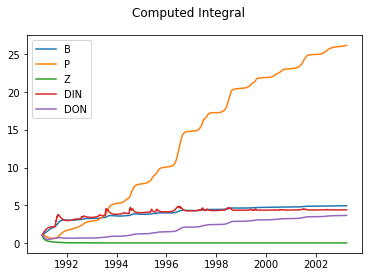

In [12]:
NPZNB.Integrate(NPZNBcalibration.initial, Calibration=best,TimeSeries= nutrients, dt=0.01) 
legend = ["B", "P", "Z", "DIN","DON"]
NPZNB.Draw(legend=legend)

In [13]:
BVal = emlib.Observation ("B", dirname="Data",filename= "NB_Count_Validate.csv")

DEBUG -739- ['DATE', 'B']
DEBUG -741- New OBS for value:B COLMS:1 DataNB_Count_Validate.csv
INFO -758- Read file DataNB_Count_Validate.csv 30 Observations for value B


DEBUG -226- -STDEV	EXP	+STDEV	ISRANGE?
DEBUG -268- GFMODEL #51 Xtot2.474 RMSD%:48.7 RMSE:3.139 RANGE%58.8 WMSE:10.8
DEBUG -1452- New fitness object:20001
DEBUG -2515- update_title_pos
DEBUG -2515- update_title_pos
DEBUG -2515- update_title_pos
DEBUG -2515- update_title_pos


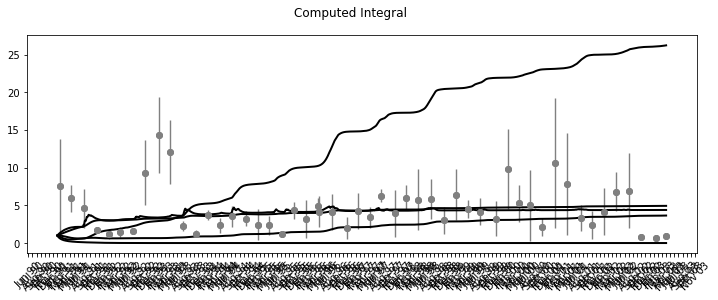

GFMODEL #51 Xtot:2.474 RMSD:48.7 RMSE:3.139 RANGE%58.8 MSER:11.3 WMSE:10.8


In [14]:
NPZNB.Validate(BTest, graph =True) 
NPZNB.fit.Print()